# Email-EU Network Analysis: EDA and Preprocessing

This notebook performs comprehensive Exploratory Data Analysis (EDA) and preprocessing on the EU email communication network dataset from SNAP (Stanford Network Analysis Project). The analysis includes graph structure exploration, department interaction patterns, feature engineering, and predictive modeling for department classification and link prediction.

In [1]:
%pip install matplotlib

## 1. Environment Setup and Library Imports

Import all necessary libraries for data manipulation, graph analysis, visualization, and machine learning.

In [2]:
import numpy as np
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from sklearn import datasets, model_selection, preprocessing, metrics
import tensorflow as tf
import joblib

## 2. Data Loading and Initial Inspection

Download the Email-EU-Core dataset from SNAP and load both the email network edges and department labels. This dataset contains email communications between members of a European research institution, with 42 departments.

In [3]:
# Download data directly from SNAP
import urllib.request
import gzip
import shutil
import os

os.makedirs('../data/raw', exist_ok=True)

print("Downloading email-Eu-core.txt...")
url_emails = 'https://snap.stanford.edu/data/email-Eu-core.txt.gz'
urllib.request.urlretrieve(url_emails, '../data/raw/email-Eu-core.txt.gz')

# Decompress
with gzip.open('../data/raw/email-Eu-core.txt.gz', 'rb') as f_in:
    with open('../data/raw/email-Eu-core.txt', 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)

# Download email-Eu-core-department-labels.txt
print("Downloading email-Eu-core-department-labels.txt...")
url_labels = 'https://snap.stanford.edu/data/email-Eu-core-department-labels.txt.gz'
urllib.request.urlretrieve(url_labels, '../data/raw/email-Eu-core-department-labels.txt.gz')

# Decompress
with gzip.open('../data/raw/email-Eu-core-department-labels.txt.gz', 'rb') as f_in:
    with open('../data/raw/email-Eu-core-department-labels.txt', 'wb') as f_out:
        shutil.copyfileobj(f_in, f_out)

print("Download complete!")

# Read the data
df_emails = pd.read_csv('../data/raw/email-Eu-core.txt', sep=' ', names=['source', 'target'], comment='#')
df_department = pd.read_csv('../data/raw/email-Eu-core-department-labels.txt', sep=' ', names=['node', 'department'])

print(f"Emails dataset: {len(df_emails)} edges")
print(f"Department labels: {len(df_department)} nodes")
print(f"Unique departments: {df_department['department'].nunique()}")

df_emails.head()

Download complete!
Emails dataset: 25571 edges
Department labels: 1005 nodes
Unique departments: 42


,source,target
0,0,1
1,2,3
2,2,4
3,5,6
4,5,7


### Exploratory Questions to Answer:
1. **Data Completeness**: Are there missing values or data quality issues?
2. **Data Distribution**: How many edges and nodes do we have?
3. **Edge Patterns**: Are there self-loops, duplicates, or bidirectional emails?
4. **Node Coverage**: Do all nodes in the graph have department labels?
5. **Label Quality**: Are department assignments consistent and complete?

In [4]:
df_department.head()

,node,department
0,0,1
1,1,1
2,2,21
3,3,21
4,4,21


### 2.1 Data Quality Checks

**Missing Analysis**: Check for missing values, duplicates, and data integrity issues before proceeding with graph construction.

In [5]:
print(df_department.shape)
df_emails.shape

(1005, 2)


(25571, 2)

### 2.2 Basic Dataset Statistics

Examine the shape, size, and basic properties of the email edges and department labels datasets.

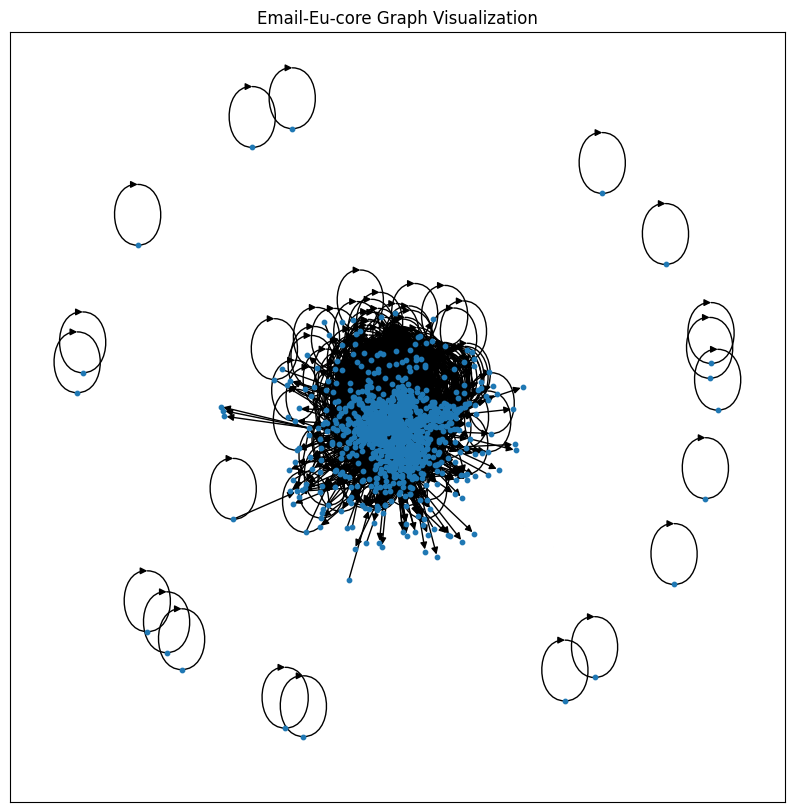

In [6]:
graph = nx.from_pandas_edgelist(df_emails, source='source', target='target',create_using=nx.DiGraph())
plt.figure(figsize=(10,10))
nx.draw_networkx(graph, with_labels=False, node_size=10)
plt.title("Email-Eu-core Graph Visualization")
plt.show()

## 3. Graph Construction and Preprocessing

### 3.1 Initial Graph Creation

Convert the edge list into a NetworkX graph object for network analysis. This creates a directed graph representing email communication flows.

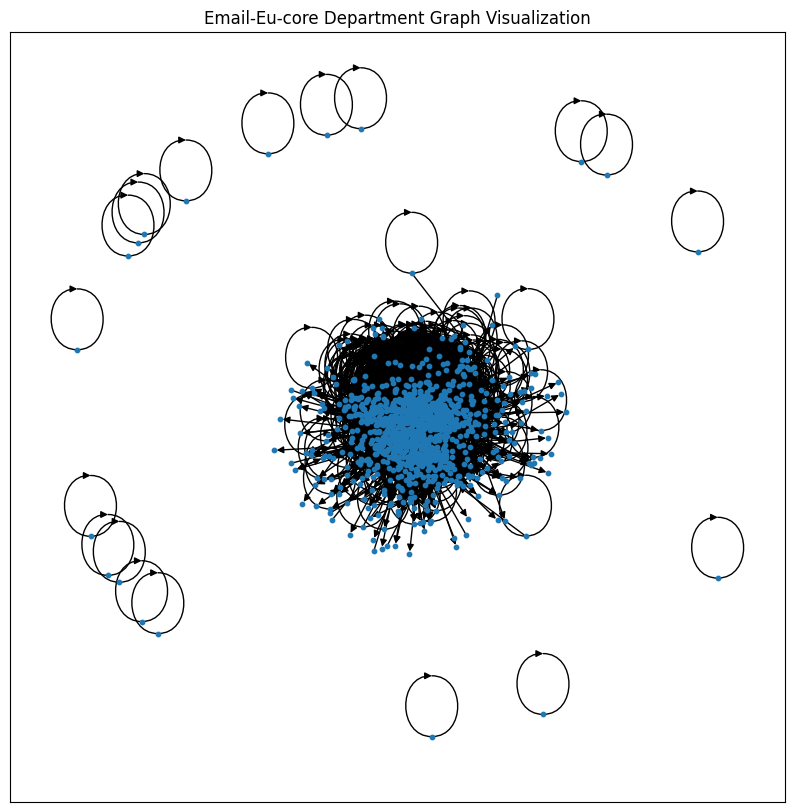

In [7]:
df_department.head()
dep_graph = nx.from_pandas_edgelist(df_emails, source='source', target='target',create_using=nx.DiGraph())

plt.figure(figsize=(10,10))
nx.draw_networkx(dep_graph, with_labels=False, node_size=10)
plt.title("Email-Eu-core Department Graph Visualization")
plt.show()

### 3.2 Graph Visualization

Visualize the network structure using a spring layout algorithm. This helps identify clusters, hubs, and the overall connectivity pattern.

EDA

In [8]:
print('number of nodes in graph of messages',graph.number_of_nodes())
print('number of edges in graph of messages',graph.number_of_edges())

number of nodes in graph of messages 1005
number of edges in graph of messages 25571


## 4. Network Structure Analysis

### 4.1 Basic Graph Properties

Analyze fundamental graph properties including number of nodes, edges, density, and directedness.

messages degree distribution


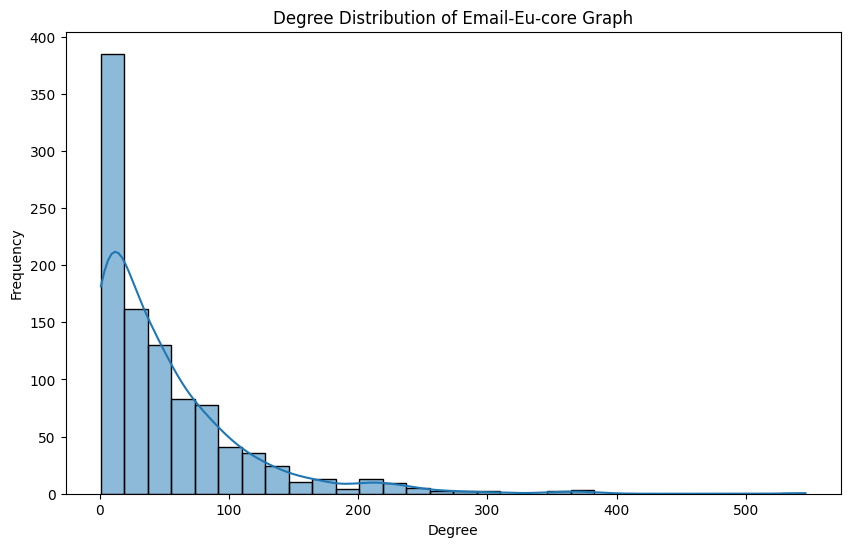

In [9]:
print('messages degree distribution')
degrees = [deg for node, deg in graph.degree()]
plt.figure(figsize=(10,6))
sns.histplot(degrees, bins=30, kde=True)
plt.title("Degree Distribution of Email-Eu-core Graph")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.show()


### 4.2 Degree Distribution Analysis

Examine the degree distribution to understand email communication patterns. High-degree nodes represent highly connected individuals (potential hubs or influencers).

clustering coefficient


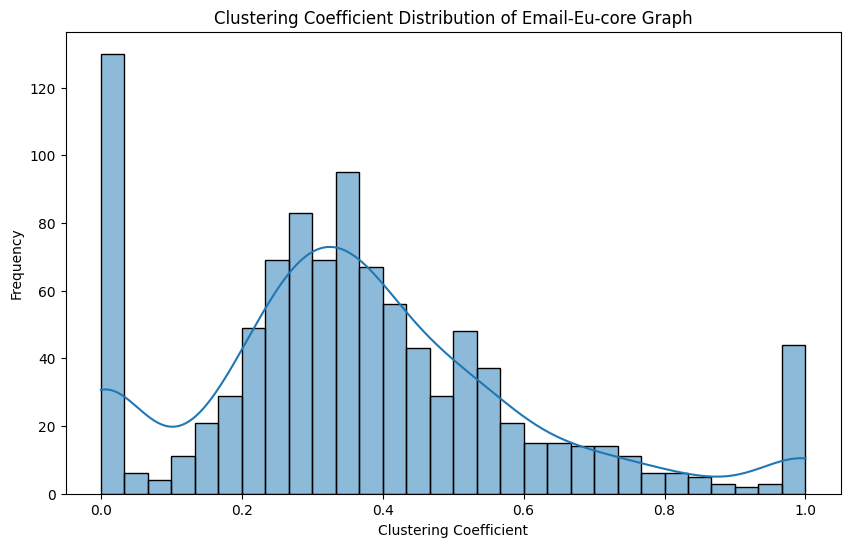

In [10]:
print('clustering coefficient')
clustering_coeffs = nx.clustering(graph)
plt.figure(figsize=(10,6))
sns.histplot(list(clustering_coeffs.values()), bins=30, kde=True)
plt.title("Clustering Coefficient Distribution of Email-Eu-core Graph")
plt.xlabel("Clustering Coefficient")
plt.ylabel("Frequency")
plt.show()

### 4.3 In-Degree and Out-Degree Analysis

Separate analysis of incoming and outgoing connections to identify:
- **High in-degree**: People who receive many emails (information receivers)
- **High out-degree**: People who send many emails (information broadcasters)

In [11]:
print('average clustering coefficient:', np.mean(list(clustering_coeffs.values())))
print(f"Global clustering coefficient: {nx.transitivity(graph):.4f}")


average clustering coefficient: 0.3656613629131561
Global clustering coefficient: 0.2201


### 4.4 Most Connected Nodes

Identify the top nodes by degree - these are key individuals in the communication network.

In [12]:
print('display of week connected components/strong connected')

weakly_connected_components = list(nx.weakly_connected_components(graph))
strongly_connected_components = list(nx.strongly_connected_components(graph))
print(f'number of weakly connected components: {len(weakly_connected_components)}')
print(f'number of strong connected components: {len(strongly_connected_components)}')

display of week connected components/strong connected
number of weakly connected components: 20
number of strong connected components: 203


### 4.5 Clustering Coefficient

Calculate the clustering coefficient to measure the degree to which nodes tend to cluster together (forming tight-knit groups).

In [13]:
undirected_graph_copy=graph.to_undirected()
print('number of closed triangles in the graph:', sum(nx.triangles(undirected_graph_copy).values()) // 3)
print('fraction of closed triangles in the graph:', (sum(nx.triangles(undirected_graph_copy).values()) // 3) / graph.number_of_nodes())

number of closed triangles in the graph: 105461
fraction of closed triangles in the graph: 104.9363184079602


### 4.6 Connected Components Analysis

Examine the connectivity of the graph by identifying separate connected components. A well-connected organization should have most nodes in a single large component.

Visualization of small subgroups of graphs

small subgroups of graphs (triangles, quadrangles, pentagons)


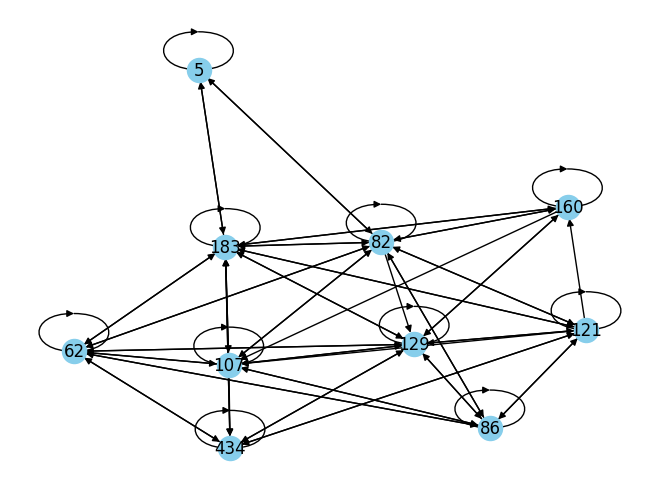

In [14]:
print('small subgroups of graphs (triangles, quadrangles, pentagons)')

sub_nodes = list(sorted(graph.degree, key=lambda x: x[1], reverse=True))[:10]
subgraph = graph.subgraph([n for n, d in sub_nodes])
nx.draw(subgraph, with_labels=True, node_color="skyblue")
plt.show()



### 4.7 Path Length Analysis

Calculate shortest path lengths and diameter to understand information flow efficiency in the network.

In [15]:
dept_dict = df_department.set_index('node')['department'].to_dict()
nx.set_node_attributes(graph, dept_dict, 'department')

## 5. Department Analysis

### 5.1 Node-Department Label Mapping

Create mapping between node IDs and their department affiliations for department-level analysis.

In [16]:
from collections import Counter


dept_count = Counter(dept_dict.values())
dept_count

Counter({1: 65,
         21: 61,
         25: 6,
         14: 92,
         9: 32,
         26: 9,
         4: 109,
         17: 35,
         34: 13,
         11: 29,
         5: 18,
         10: 39,
         36: 22,
         37: 15,
         7: 51,
         22: 25,
         8: 19,
         15: 55,
         3: 12,
         29: 5,
         20: 14,
         16: 25,
         38: 13,
         27: 10,
         13: 26,
         6: 28,
         0: 49,
         28: 8,
         2: 10,
         40: 4,
         35: 13,
         23: 27,
         19: 29,
         24: 6,
         32: 9,
         31: 8,
         39: 3,
         12: 3,
         30: 4,
         41: 2,
         18: 1,
         33: 1})

### Exploratory Analysis Goals:
1. **Understand Organizational Structure**: How many departments exist?
2. **Department Sizes**: Are departments balanced or highly imbalanced?
3. **Collaboration Patterns**: Which departments communicate most?
4. **Silos vs. Integration**: Are departments isolated or interconnected?
5. **Department Characteristics**: Do departments have distinct network signatures?
6. **Data Sufficiency**: Is there enough data per department for classification?

### 5.2 Label Coverage Analysis

Check how many nodes have department labels vs. unlabeled nodes. This determines data completeness for supervised learning tasks.

departement sizes


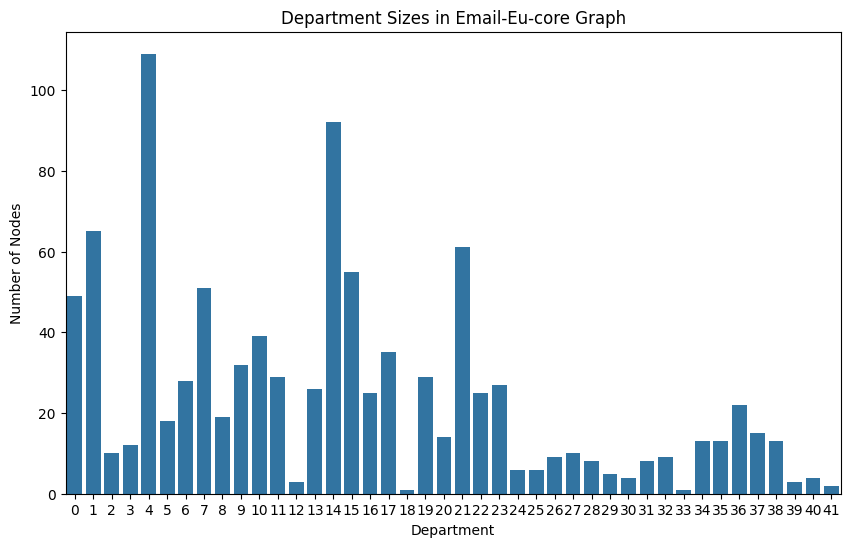

In [17]:
print('departement sizes')

plt.figure(figsize=(10,6))
sns.barplot(x=list(dept_count.keys()), y=list(dept_count.values()))
plt.title("Department Sizes in Email-Eu-core Graph")
plt.xlabel("Department")
plt.ylabel("Number of Nodes")
plt.show()

### EDA Focus: Class Imbalance Investigation

**Critical Questions to Explore:**
- How many members does each department have?
- What is the imbalance ratio between largest and smallest departments?
- Can we perform stratified splitting with this distribution?
- Should we filter out departments with too few samples?
- What percentage of data would we lose if we enforce minimum thresholds?

### 5.3 Department Size Distribution

Analyze the distribution of members across departments to understand:
- Class imbalance issues for classification
- Organizational structure (large vs. small departments)
- Stratification feasibility for train/test splits

In [18]:
num_departments = df_department['department'].nunique()
print('number of departments:', num_departments)
interaction_matrix = np.zeros((num_departments, num_departments), dtype=int)
for u, v in undirected_graph_copy.edges():
    dept_u = dept_dict[u]
    dept_v = dept_dict[v]
    interaction_matrix[dept_u, dept_v] += 1
departments = sorted(df_department['department'].unique())
df_heatmap = pd.DataFrame(interaction_matrix, index=departments, columns=departments)


number of departments: 42


### 5.4 Department-Colored Network Visualization

Visualize the graph with nodes colored by department to see if departments form distinct clusters or are intermixed.

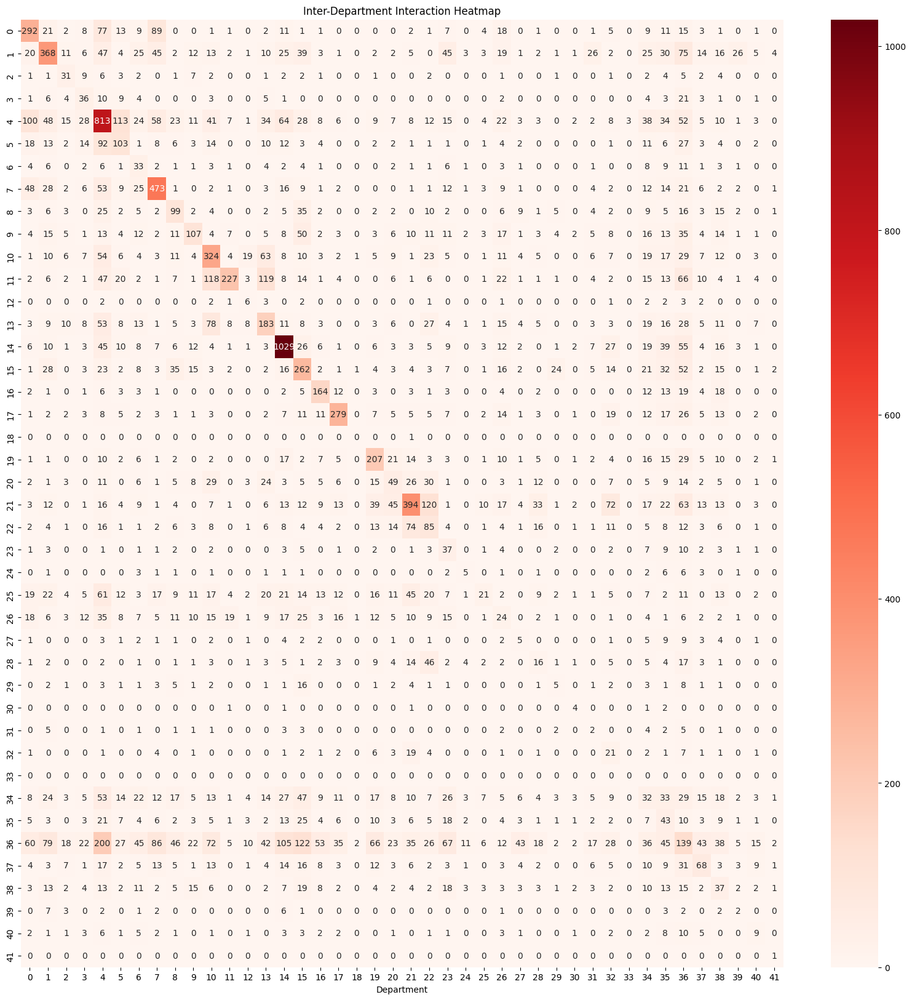

In [19]:
plt.figure(figsize=(20,20))
sns.heatmap(df_heatmap, annot=True, fmt='d', cmap='Reds')
plt.title("Inter-Department Interaction Heatmap")
plt.xlabel("Department")
plt.show()

### 5.5 Department Interaction Network

Create a high-level department-to-department network showing inter-departmental communication patterns.

degree stats
in-degrees
count    1005.000000
mean       25.443781
std        27.970817
min         0.000000
25%         5.000000
50%        18.000000
75%        36.000000
max       212.000000
dtype: float64
out-degrees
count    1005.000000
mean       25.443781
std        33.323927
min         0.000000
25%         2.000000
50%        15.000000
75%        35.000000
max       334.000000
dtype: float64
total-degrees
count    1005.000000
mean       50.887562
std        60.157349
min         1.000000
25%         8.000000
50%        32.000000
75%        71.000000
max       546.000000
dtype: float64


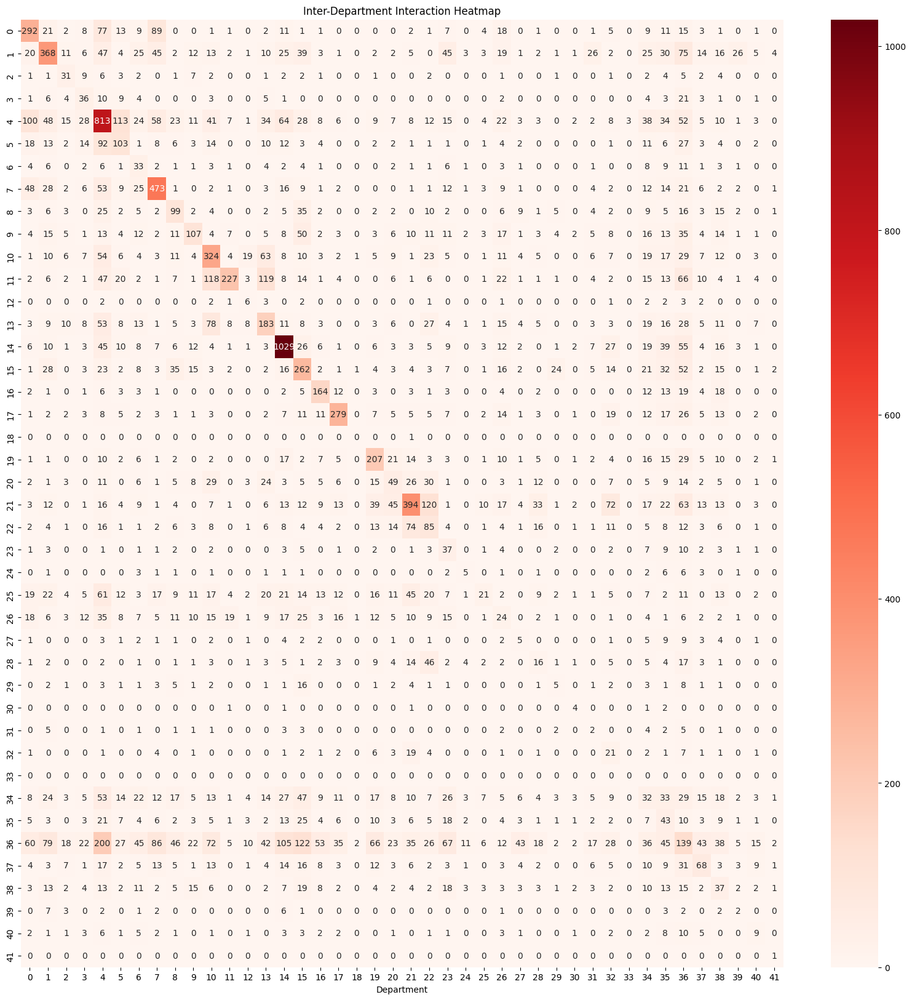

In [20]:
print('degree stats')
in_degrees=dict(graph.in_degree())
out_degree=dict(graph.out_degree())
total_degree=dict(graph.degree())
print('in-degrees')
in_degree_stats = pd.Series(in_degrees).describe()
print(in_degree_stats)
print('out-degrees')
out_degree_stats = pd.Series(out_degree).describe()
print(out_degree_stats)
print('total-degrees')
total_degree_stats = pd.Series(total_degree).describe()
print(total_degree_stats)
plt.figure(figsize=(20,20))
sns.heatmap(df_heatmap, annot=True, fmt='d', cmap='Reds')
plt.title("Inter-Department Interaction Heatmap")
plt.xlabel("Department")
plt.show()

### 5.6 Department Interaction Heatmap

Visualize the intensity of email communication between different departments using a heatmap matrix. This reveals which departments collaborate most frequently.

In [21]:
print(f"max in-degree: {max(in_degrees.values())}")
print(f"max out-degree: {max(out_degree.values())}")

print(" Top 10 nodes by total degree:")
top_degree_nodes = sorted(total_degree.items(), key=lambda x: x[1], reverse=True)[:10]
for node, degree in top_degree_nodes:
    dept = dept_dict.get(node, 'Unknown')
    print(f"   Node {node}: degree={degree}, department={dept}")


max in-degree: 212
max out-degree: 334
 Top 10 nodes by total degree:
   Node 160: degree=546, department=36
   Node 121: degree=379, department=36
   Node 107: degree=373, department=36
   Node 62: degree=369, department=36
   Node 86: degree=356, department=36
   Node 82: degree=348, department=36
   Node 434: degree=308, department=34
   Node 183: degree=302, department=4
   Node 5: degree=280, department=25
   Node 129: degree=275, department=4


### 5.7 Intra vs. Inter-Department Communication

Analyze the proportion of emails that stay within departments vs. those that cross departmental boundaries.

degrees dist


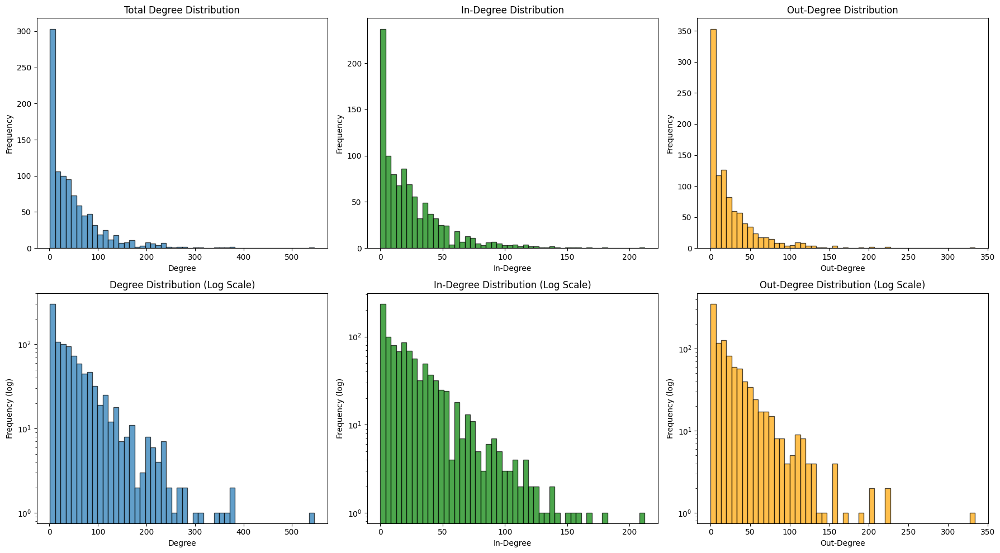

In [22]:
print('degrees dist')
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Total degree
axes[0, 0].hist(list(total_degree.values()), bins=50, edgecolor='black', alpha=0.7)
axes[0, 0].set_xlabel('Degree')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Total Degree Distribution')

# In-degree
axes[0, 1].hist(list(in_degrees.values()), bins=50, edgecolor='black', alpha=0.7, color='green')
axes[0, 1].set_xlabel('In-Degree')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('In-Degree Distribution')

# Out-degree
axes[0, 2].hist(list(out_degree.values()), bins=50, edgecolor='black', alpha=0.7, color='orange')
axes[0, 2].set_xlabel('Out-Degree')
axes[0, 2].set_ylabel('Frequency')
axes[0, 2].set_title('Out-Degree Distribution')

# Log scale versions
axes[1, 0].hist(list(total_degree.values()), bins=50, edgecolor='black', alpha=0.7, log=True)
axes[1, 0].set_xlabel('Degree')
axes[1, 0].set_ylabel('Frequency (log)')
axes[1, 0].set_title('Degree Distribution (Log Scale)')

axes[1, 1].hist(list(in_degrees.values()), bins=50, edgecolor='black', alpha=0.7, color='green', log=True)
axes[1, 1].set_xlabel('In-Degree')
axes[1, 1].set_ylabel('Frequency (log)')
axes[1, 1].set_title('In-Degree Distribution (Log Scale)')

axes[1, 2].hist(list(out_degree.values()), bins=50, edgecolor='black', alpha=0.7, color='orange', log=True)
axes[1, 2].set_xlabel('Out-Degree')
axes[1, 2].set_ylabel('Frequency (log)')
axes[1, 2].set_title('Out-Degree Distribution (Log Scale)')

plt.tight_layout()
plt.show()

### 5.8 Department-Level Network Metrics

Calculate aggregated network metrics for each department:
- Average degree
- Clustering coefficient
- Department centrality measures

This helps understand which departments are more central or isolated in the organization.

In [23]:
print(f"\nTotal inter-department emails: {interaction_matrix.sum().sum():.0f}")
print(f"\nTop 5 department communication pairs:")
interaction_pairs = []
for i in df_heatmap.index:
    for j in df_heatmap.columns:
        if i != j:
            interaction_pairs.append((i, j, df_heatmap.loc[i, j]))
interaction_pairs.sort(key=lambda x: x[2], reverse=True)
for source, target, count in interaction_pairs[:5]:
    print(f"   Dept {source} → Dept {target}: {count:.0f} emails")


Total inter-department emails: 16706

Top 5 department communication pairs:
   Dept 36 → Dept 4: 200 emails
   Dept 36 → Dept 15: 122 emails
   Dept 21 → Dept 22: 120 emails
   Dept 11 → Dept 13: 119 emails
   Dept 11 → Dept 10: 118 emails


### 5.9 Department Subgraph Analysis

Extract and analyze subgraphs for individual departments to understand internal communication patterns.

Feature engineering

In [ ]:
from tqdm import tqdm

def extract_all_node_features(G, node, precomputed_metrics):
    features = {}
    
    # communication patterns
    features['out_degree'] = G.out_degree(node)
    features['in_degree'] = G.in_degree(node)
    features['total_degree'] = G.degree(node)
    
    # communication style
    if features['in_degree'] > 0:
        features['send_receive_ratio'] = features['out_degree'] / features['in_degree']
    else:
        features['send_receive_ratio'] = features['out_degree']
    
    # reciprocity
    in_neighbors = set(G.predecessors(node))
    out_neighbors = set(G.successors(node))
    mutual = in_neighbors & out_neighbors
    features['reciprocal_edges'] = len(mutual)
    features['reciprocity_rate'] = len(mutual) / max(features['total_degree'], 1)
    
    # influecne and importance
    features['pagerank'] = precomputed_metrics['pagerank'][node]
    features['closeness'] = precomputed_metrics['closeness'][node]
    
    # community integration
    G_undirected = G.to_undirected()
    features['clustering_coef'] = nx.clustering(G_undirected, node)
    features['triangles'] = nx.triangles(G_undirected, node)
    
    # ego network
    ego = nx.ego_graph(G, node, radius=1)
    features['ego_size'] = len(ego.nodes())
    features['ego_density'] = nx.density(ego) if len(ego.nodes()) > 1 else 0
    
    # neighbors caracteristics
    in_neighbors_list = list(in_neighbors)
    out_neighbors_list = list(out_neighbors)
    
    # average neighbor degrees
    if in_neighbors_list:
        features['avg_in_neighbor_degree'] = np.mean([G.degree(n) for n in in_neighbors_list])
        features['max_in_neighbor_degree'] = max([G.degree(n) for n in in_neighbors_list])
    else:
        features['avg_in_neighbor_degree'] = 0
        features['max_in_neighbor_degree'] = 0
    
    if out_neighbors_list:
        features['avg_out_neighbor_degree'] = np.mean([G.degree(n) for n in out_neighbors_list])
        features['max_out_neighbor_degree'] = max([G.degree(n) for n in out_neighbors_list])
    else:
        features['avg_out_neighbor_degree'] = 0
        features['max_out_neighbor_degree'] = 0
    
    return features

print("features extractetion")

print("Step 1: Computing global metrics...")
precomputed_metrics = {
    'pagerank': nx.pagerank(graph),
    'closeness': nx.closeness_centrality(graph)
}

print("Step 2: Extracting features for each node...")
feature_list = []
labels = []

for node in tqdm(dept_dict.keys(), desc="Processing nodes"):
    if node in graph.nodes():
        features = extract_all_node_features(graph, node, precomputed_metrics)
        feature_list.append(features)
        labels.append(dept_dict[node])

X_df = pd.DataFrame(feature_list)
y = np.array(labels)

print(f" feature extraction complete!")
print(f"   samples: {len(X_df)}")
print(f"   features: {len(X_df.columns)}")
print(f"   classes: {len(np.unique(y))}")

print(f"features ({len(X_df.columns)} total):")
for i, col in enumerate(X_df.columns, 1):
    print(f"   {i:2d}. {col}")

print(f"sample data:")
print(X_df.head())

=== FEATURE EXTRACTION ===

Step 1: Computing global metrics...
Step 2: Extracting features for each node...


Processing nodes: 100%|██████████| 1005/1005 [01:06<00:00, 15.03it/s]


✅ Feature extraction complete!
   Samples: 1005
   Features: 16
   Classes: 42

📋 Features (16 total):
    1. out_degree
    2. in_degree
    3. total_degree
    4. send_receive_ratio
    5. reciprocal_edges
    6. reciprocity_rate
    7. pagerank
    8. closeness
    9. clustering_coef
   10. triangles
   11. ego_size
   12. ego_density
   13. avg_in_neighbor_degree
   14. max_in_neighbor_degree
   15. avg_out_neighbor_degree
   16. max_out_neighbor_degree

📊 Sample data:
   out_degree  in_degree  total_degree  send_receive_ratio  reciprocal_edges  \
0          41         32            73            1.281250                30   
1           1         51            52            0.019608                 1   
2          84         77           161            1.090909                67   
3          56         62           118            0.903226                48   
4          89         74           163            1.202703                68   

   reciprocity_rate  pagerank  closeness

## 6. Feature Engineering for Machine Learning

### 6.1 Comprehensive Node Feature Extraction

Extract a wide range of node-level features including:
- **Structural features**: degree centrality, betweenness, closeness, eigenvector centrality
- **Local features**: clustering coefficient, PageRank
- **Neighborhood features**: common neighbors, Jaccard coefficient
- **Community features**: Louvain community detection

These features will be used for department classification tasks.

=== CROSS-VALIDATION APPROACH ===



/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=3.
  warnings.warn(


Using StratifiedKFold (3 splits)

📊 Cross-validation results:
   Accuracy: 0.2020 (+/- 0.0325)
   Individual folds: [0.18507463 0.19701493 0.2238806 ]


/tmp/ipython-input-1347914347.py:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance, x='importance', y='feature', palette='viridis')


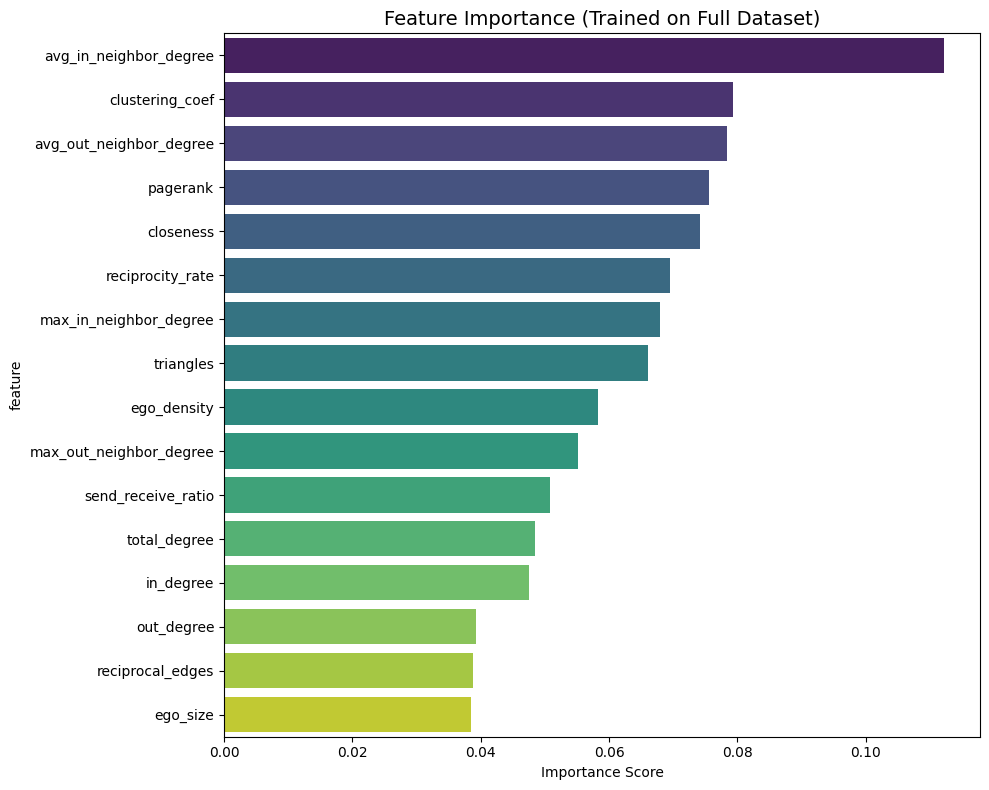


🏆 Top 10 Most Important Features:
                    feature  importance
12   avg_in_neighbor_degree    0.112210
8           clustering_coef    0.079304
14  avg_out_neighbor_degree    0.078322
6                  pagerank    0.075628
7                 closeness    0.074190
5          reciprocity_rate    0.069480
13   max_in_neighbor_degree    0.067926
9                 triangles    0.066147
11              ego_density    0.058208
15  max_out_neighbor_degree    0.055181


In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42, max_depth=10))
])

# Use StratifiedKFold with small k to handle small classes
try:
    # Try stratified first
    cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    scores = cross_val_score(pipeline, X_df.values, y, cv=cv, scoring='accuracy')
    print("Using StratifiedKFold (3 splits)")
except ValueError as e:
    # If fails, use regular KFold
    print(f"StratifiedKFold failed: {e}")
    print("Falling back to regular KFold")
    from sklearn.model_selection import KFold
    cv = KFold(n_splits=3, shuffle=True, random_state=42)
    scores = cross_val_score(pipeline, X_df.values, y, cv=cv, scoring='accuracy')

print(f"cross-validation results:")
print(f"  accuracy: {scores.mean():.4f} (+/- {scores.std() * 2:.4f})")
print(f" individual folds: {scores}")
    
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_df.values)

rf_full = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=10)
rf_full.fit(X_scaled, y)

feature_importance = pd.DataFrame({
    'feature': X_df.columns,
    'importance': rf_full.feature_importances_
}).sort_values('importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(data=feature_importance, x='importance', y='feature', palette='viridis')
plt.title('Feature Importance (Trained on Full Dataset)', fontsize=14)
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

print("top 10 Most Important Features:")
print(feature_importance.head(10))

### 6.2 Feature Distribution Analysis

Examine the distributions of extracted features to identify:
- Skewed features that may need transformation
- Outliers that could affect model performance
- Features with low variance (potentially uninformative)

In [ ]:
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

def extract_enhanced_features(G, node, precomputed_metrics):
    
    features = {}
    
    features['out_degree'] = G.out_degree(node)
    features['in_degree'] = G.in_degree(node)
    features['total_degree'] = G.degree(node)
    if features['in_degree'] > 0:
        features['send_receive_ratio'] = features['out_degree'] / features['in_degree']
    else:
        features['send_receive_ratio'] = features['out_degree'] + 1
    
    features['degree_squared'] = features['total_degree'] ** 2
    features['log_degree'] = np.log1p(features['total_degree'])
    
    in_neighbors = set(G.predecessors(node))
    out_neighbors = set(G.successors(node))
    mutual = in_neighbors & out_neighbors
    
    features['reciprocal_edges'] = len(mutual)
    features['reciprocity_rate'] = len(mutual) / max(features['total_degree'], 1)
    
    features['only_send'] = len(out_neighbors - in_neighbors)
    features['only_receive'] = len(in_neighbors - out_neighbors)
    
    features['pagerank'] = precomputed_metrics['pagerank'][node]
    features['closeness'] = precomputed_metrics['closeness'][node]
    
    if 'betweenness' in precomputed_metrics:
        features['betweenness'] = precomputed_metrics['betweenness'].get(node, 0)
    
    if 'eigenvector' in precomputed_metrics:
        features['eigenvector'] = precomputed_metrics['eigenvector'][node]
    
    features['pagerank_log'] = np.log1p(features['pagerank'])
    
    G_undirected = G.to_undirected()
    features['clustering_coef'] = nx.clustering(G_undirected, node)
    features['triangles'] = nx.triangles(G_undirected, node)
    features['triangles_log'] = np.log1p(features['triangles'])
    
    if 'square_clustering' in precomputed_metrics:
        features['square_clustering'] = precomputed_metrics['square_clustering'].get(node, 0)
    else:
        features['square_clustering'] = 0
    
    ego = nx.ego_graph(G, node, radius=1)
    features['ego_size'] = len(ego.nodes())
    features['ego_edges'] = len(ego.edges())
    features['ego_density'] = nx.density(ego) if len(ego.nodes()) > 1 else 0
    
    if len(ego.nodes()) > 1:
        ego_degrees = [ego.degree(n) for n in ego.nodes()]
        features['ego_degree_centralization'] = (max(ego_degrees) - np.mean(ego_degrees)) / max(1, max(ego_degrees))
    else:
        features['ego_degree_centralization'] = 0
    
    ego_2 = nx.ego_graph(G, node, radius=2)
    features['ego_2_size'] = len(ego_2.nodes())
    features['ego_growth'] = features['ego_2_size'] / max(1, features['ego_size'])
    
    in_neighbors_list = list(in_neighbors)
    out_neighbors_list = list(out_neighbors)
    
    if in_neighbors_list:
        in_degrees = [G.degree(n) for n in in_neighbors_list]
        features['avg_in_neighbor_degree'] = np.mean(in_degrees)
        features['max_in_neighbor_degree'] = max(in_degrees)
        features['std_in_neighbor_degree'] = np.std(in_degrees)
    else:
        features['avg_in_neighbor_degree'] = 0
        features['max_in_neighbor_degree'] = 0
        features['std_in_neighbor_degree'] = 0
    
    if out_neighbors_list:
        out_degrees = [G.degree(n) for n in out_neighbors_list]
        features['avg_out_neighbor_degree'] = np.mean(out_degrees)
        features['max_out_neighbor_degree'] = max(out_degrees)
        features['std_out_neighbor_degree'] = np.std(out_degrees)
    else:
        features['avg_out_neighbor_degree'] = 0
        features['max_out_neighbor_degree'] = 0
        features['std_out_neighbor_degree'] = 0
    
    if 'core_number' in precomputed_metrics:
        features['core_number'] = precomputed_metrics['core_number'].get(node, 0)
    
    neighbors_list = list(G.neighbors(node))
    if len(neighbors_list) > 1:
        subgraph = G.subgraph(neighbors_list).to_undirected()
        features['local_efficiency'] = nx.global_efficiency(subgraph)
    else:
        features['local_efficiency'] = 0
    
    # How many different departments does this node communicate with?
    if 'dept_dict' in precomputed_metrics:
        dept_dict = precomputed_metrics['dept_dict']
        out_depts = set([dept_dict.get(n, -1) for n in out_neighbors_list if n in dept_dict])
        in_depts = set([dept_dict.get(n, -1) for n in in_neighbors_list if n in dept_dict])
        
        features['num_out_departments'] = len(out_depts)
        features['num_in_departments'] = len(in_depts)
        features['total_departments_contacted'] = len(out_depts | in_depts)
    
    return features



print("Step 1: Computing global metrics (this may take a while)...")

precomputed_metrics = {
    'pagerank': nx.pagerank(graph),
    'closeness': nx.closeness_centrality(graph),
    'dept_dict': dept_dict
}

# Remove self-loops for algorithms that don't support them
print("   Creating graph without self-loops...")
graph_no_selfloops = graph.copy()
graph_no_selfloops.remove_edges_from(nx.selfloop_edges(graph_no_selfloops))

# K-core decomposition (requires no self-loops)
print("   Computing k-core...")
try:
    precomputed_metrics['core_number'] = nx.core_number(graph_no_selfloops)
except Exception as e:
    print(f"   (K-core computation failed: {e})")

# Square clustering (requires no self-loops)
print("   Computing square clustering...")
try:
    G_undirected_no_selfloops = graph_no_selfloops.to_undirected()
    precomputed_metrics['square_clustering'] = nx.square_clustering(G_undirected_no_selfloops)
except Exception as e:
    print(f"   (Square clustering failed: {e})")

# Eigenvector centrality (if graph allows)
print("   Computing eigenvector centrality...")
try:
    precomputed_metrics['eigenvector'] = nx.eigenvector_centrality(graph, max_iter=100)
except Exception as e:
    print(f"   (Eigenvector centrality failed: {e})")

# Betweenness (sample for speed)
print("   Computing betweenness (sampled)...")
try:
    # Sample 20% of nodes for speed
    sample_nodes = np.random.choice(list(graph.nodes()), 
                                   size=max(100, int(0.2 * graph.number_of_nodes())), 
                                   replace=False)
    betweenness_sample = nx.betweenness_centrality_subset(
        graph, 
        sources=sample_nodes,
        targets=sample_nodes
    )
    precomputed_metrics['betweenness'] = betweenness_sample
except Exception as e:
    print(f"   (Betweenness computation failed: {e})")

print("\nStep 2: Extracting enhanced features for each node...")
feature_list = []
labels = []

for node in tqdm(dept_dict.keys(), desc="Processing nodes"):
    if node in graph.nodes():
        features = extract_enhanced_features(graph, node, precomputed_metrics)
        feature_list.append(features)
        labels.append(dept_dict[node])

X_df_enhanced = pd.DataFrame(feature_list)
y = np.array(labels)

print(f"\n✅ Enhanced feature extraction complete!")
print(f"   Samples: {len(X_df_enhanced)}")
print(f"   Features: {len(X_df_enhanced.columns)}")
print(f"   Classes: {len(np.unique(y))}")

# Display feature names
print(f"\n📋 Enhanced Features ({len(X_df_enhanced.columns)} total):")
for i, col in enumerate(X_df_enhanced.columns, 1):
    print(f"   {i:2d}. {col}")

# Show sample
print(f"\n📊 Sample data:")
print(X_df_enhanced.head())

=== ENHANCED FEATURE EXTRACTION ===

Step 1: Computing global metrics (this may take a while)...
   Creating graph without self-loops...
   Computing k-core...
   Computing square clustering...
   Computing eigenvector centrality...
   Computing betweenness (sampled)...

Step 2: Extracting enhanced features for each node...


Processing nodes: 100%|██████████| 1005/1005 [01:33<00:00, 10.73it/s]


✅ Enhanced feature extraction complete!
   Samples: 1005
   Features: 36
   Classes: 42

📋 Enhanced Features (36 total):
    1. out_degree
    2. in_degree
    3. total_degree
    4. send_receive_ratio
    5. degree_squared
    6. log_degree
    7. reciprocal_edges
    8. reciprocity_rate
    9. only_send
   10. only_receive
   11. pagerank
   12. closeness
   13. betweenness
   14. eigenvector
   15. pagerank_log
   16. clustering_coef
   17. triangles
   18. triangles_log
   19. square_clustering
   20. ego_size
   21. ego_edges
   22. ego_density
   23. ego_degree_centralization
   24. ego_2_size
   25. ego_growth
   26. avg_in_neighbor_degree
   27. max_in_neighbor_degree
   28. std_in_neighbor_degree
   29. avg_out_neighbor_degree
   30. max_out_neighbor_degree
   31. std_out_neighbor_degree
   32. core_number
   33. local_efficiency
   34. num_out_departments
   35. num_in_departments
   36. total_departments_contacted

📊 Sample data:
   out_degree  in_degree  total_degree  send

### 6.3 Feature Correlation Analysis

Analyze correlations between features to identify:
- Redundant features (highly correlated)
- Independent features (low correlation)
- Feature groups that capture similar information

This helps in feature selection and understanding multicollinearity.

=== TRAINING IMPROVED MODELS ===


Random Forest (Deep):
   Accuracy: 0.2448 (+/- 0.0129)
   Folds: [0.25373134 0.23880597 0.24179104]

Gradient Boosting:
   Accuracy: 0.2388 (+/- 0.0381)
   Folds: [0.26567164 0.2238806  0.22686567]

Random Forest (Wide):
   Accuracy: 0.2438 (+/- 0.0268)
   Folds: [0.23283582 0.2358209  0.26268657]

🏆 Best Model: Random Forest (Deep)
   Best Score: 0.2448


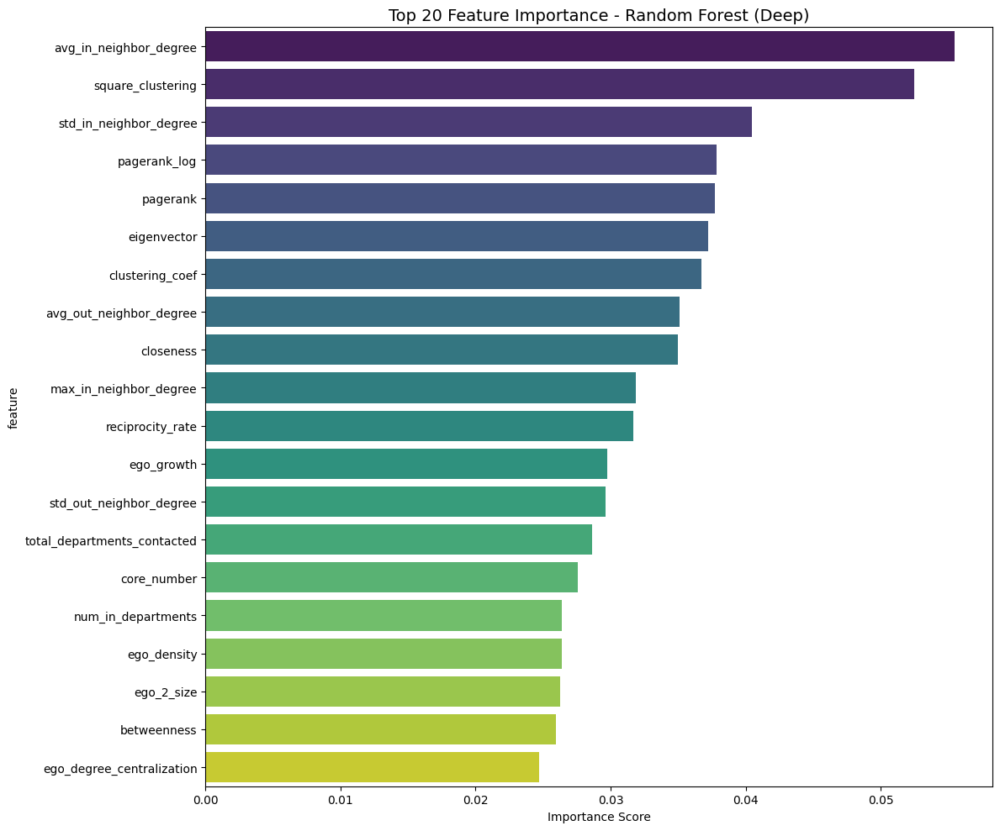


🏆 Top 20 Most Important Features:
                        feature  importance
25       avg_in_neighbor_degree    0.055488
18            square_clustering    0.052492
27       std_in_neighbor_degree    0.040442
14                 pagerank_log    0.037844
10                     pagerank    0.037727
13                  eigenvector    0.037209
15              clustering_coef    0.036702
28      avg_out_neighbor_degree    0.035092
11                    closeness    0.034997
26       max_in_neighbor_degree    0.031892
7              reciprocity_rate    0.031684
24                   ego_growth    0.029730
30      std_out_neighbor_degree    0.029599
35  total_departments_contacted    0.028621
31                  core_number    0.027572
34           num_in_departments    0.026407
21                  ego_density    0.026365
23                   ego_2_size    0.026242
12                  betweenness    0.025963
22    ego_degree_centralization    0.024698

📊 Feature Importance Statistics:
   Max 

In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


# Check for missing/inf values
X_df_enhanced = X_df_enhanced.replace([np.inf, -np.inf], np.nan)
X_df_enhanced = X_df_enhanced.fillna(0)

# Try multiple models
models = {
    'Random Forest (Deep)': RandomForestClassifier(
        n_estimators=200,
        max_depth=20,
        min_samples_split=3,
        min_samples_leaf=1,
        max_features='sqrt',
        random_state=42
    ),
    'Gradient Boosting': GradientBoostingClassifier(
        n_estimators=200,
        max_depth=5,
        learning_rate=0.1,
        random_state=42
    ),
    'Random Forest (Wide)': RandomForestClassifier(
        n_estimators=300,
        max_depth=None,
        min_samples_split=2,
        min_samples_leaf=1,
        random_state=42
    )
}

best_model = None
best_score = 0
best_name = ""

for name, model in models.items():
    print(f"\n{name}:")
    
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('model', model)
    ])
    
    try:
        cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
        scores = cross_val_score(pipeline, X_df_enhanced.values, y, cv=cv, scoring='accuracy')
        
        print(f"   Accuracy: {scores.mean():.4f} (+/- {scores.std() * 2:.4f})")
        print(f"   Folds: {scores}")
        
        if scores.mean() > best_score:
            best_score = scores.mean()
            best_model = model
            best_name = name
            
    except ValueError as e:
        print(f"   Using regular KFold...")
        from sklearn.model_selection import KFold
        cv = KFold(n_splits=3, shuffle=True, random_state=42)
        scores = cross_val_score(pipeline, X_df_enhanced.values, y, cv=cv, scoring='accuracy')
        
        print(f"   Accuracy: {scores.mean():.4f} (+/- {scores.std() * 2:.4f})")

print(f"\n🏆 Best Model: {best_name}")
print(f"   Best Score: {best_score:.4f}")

# Train best model on full dataset
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_df_enhanced.values)

best_model.fit(X_scaled, y)

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X_df_enhanced.columns,
    'importance': best_model.feature_importances_
}).sort_values('importance', ascending=False)

# Visualize top 20 features
plt.figure(figsize=(12, 10))
top_20 = feature_importance.head(20)
sns.barplot(data=top_20, x='importance', y='feature', palette='viridis')
plt.title(f'Top 20 Feature Importance - {best_name}', fontsize=14)
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

print("\n🏆 Top 20 Most Important Features:")
print(feature_importance.head(20))

print("\n📊 Feature Importance Statistics:")
print(f"   Max importance: {feature_importance['importance'].max():.4f}")
print(f"   Mean importance: {feature_importance['importance'].mean():.4f}")
print(f"   Features with importance > 0.05: {(feature_importance['importance'] > 0.05).sum()}")

### 6.4 Feature Importance Analysis (Random Forest)

Use Random Forest to estimate feature importance for department classification. This identifies which network properties are most discriminative for predicting department membership.

=== DEPARTMENT ANALYSIS ===

📊 Department Distribution:
0      49
1      65
2      10
3      12
4     109
5      18
6      28
7      51
8      19
9      32
10     39
11     29
12      3
13     26
14     92
15     55
16     25
17     35
18      1
19     29
20     14
21     61
22     25
23     27
24      6
25      6
26      9
27     10
28      8
29      5
30      4
31      8
32      9
33      1
34     13
35     13
36     22
37     15
38     13
39      3
40      4
41      2
Name: count, dtype: int64

⚠️  Class imbalance ratio: 109.00x

🎯 Baseline (majority class): 0.1085

📈 Feature Analysis:

Top 10 features by variance:
degree_squared             2.935640e+08
ego_edges                  7.390657e+05
triangles                  3.388150e+05
ego_2_size                 6.613393e+04
max_out_neighbor_degree    3.563218e+04
max_in_neighbor_degree     3.191834e+04
betweenness                2.500181e+04
total_degree               3.618907e+03
avg_out_neighbor_degree    3.253737e+03
avg_in_neighbo

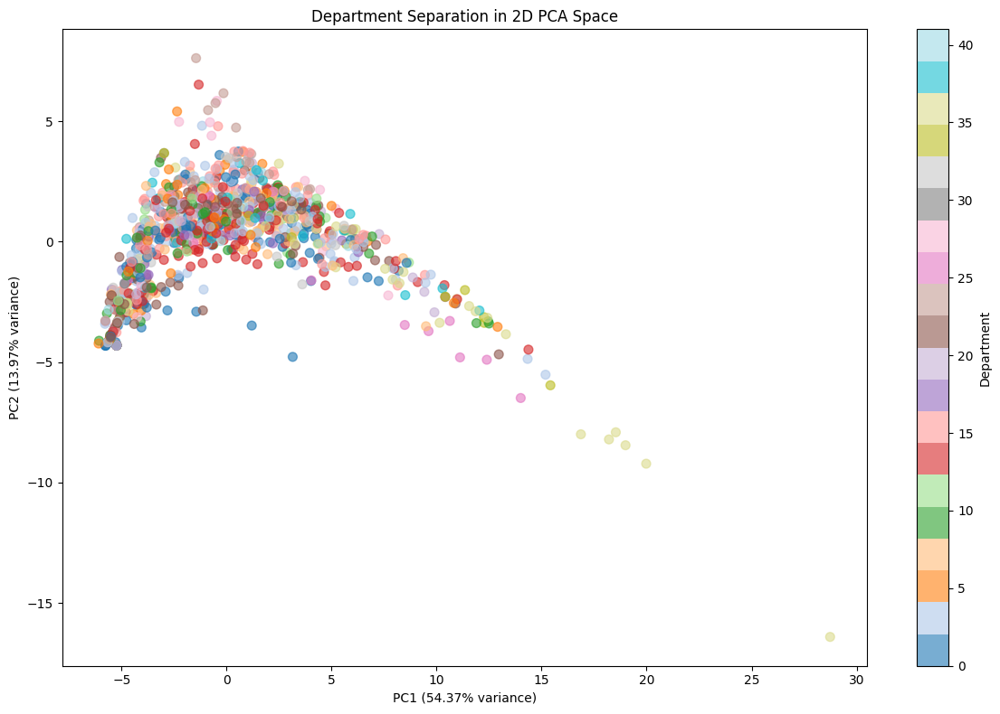


PCA explained variance: 68.34%


In [28]:
# First, let's analyze the problem
print("=== DEPARTMENT ANALYSIS ===\n")

# Check class distribution
dept_counts = pd.Series(y).value_counts().sort_index()
print("📊 Department Distribution:")
print(dept_counts)
print(f"\n⚠️  Class imbalance ratio: {dept_counts.max() / dept_counts.min():.2f}x")

# Check baseline accuracy (majority class)
baseline_acc = dept_counts.max() / len(y)
print(f"\n🎯 Baseline (majority class): {baseline_acc:.4f}")

# Analyze feature variance
print("\n📈 Feature Analysis:")
feature_variance = X_df_enhanced.var().sort_values(ascending=False)
print("\nTop 10 features by variance:")
print(feature_variance.head(10))

print("\nFeatures with near-zero variance (< 0.01):")
low_variance = feature_variance[feature_variance < 0.01]
print(f"   {len(low_variance)} features")
if len(low_variance) > 0:
    print(low_variance)

# Check correlation with target
print("\n🔗 Feature-Target Relationship:")
from scipy.stats import spearmanr

correlations = []
for col in X_df_enhanced.columns:
    corr, pval = spearmanr(X_df_enhanced[col], y)
    correlations.append({'feature': col, 'correlation': abs(corr), 'p_value': pval})

corr_df = pd.DataFrame(correlations).sort_values('correlation', ascending=False)
print("\nTop 10 features by correlation with department:")
print(corr_df.head(10))

# Visualize department separation
print("\n🎨 Visualizing Department Separation...")
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(StandardScaler().fit_transform(X_df_enhanced))

plt.figure(figsize=(12, 8))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='tab20', alpha=0.6, s=50)
plt.colorbar(scatter, label='Department')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)')
plt.title('Department Separation in 2D PCA Space')
plt.tight_layout()
plt.show()

print(f"\nPCA explained variance: {pca.explained_variance_ratio_.sum():.2%}")

### 6.5 Feature Importance (Gradient Boosting)

Complementary feature importance analysis using Gradient Boosting classifier to cross-validate the most important features.


=== SUPER ENHANCED FEATURE EXTRACTION ===

Computing graph statistics...
Extracting super enhanced features...


Processing nodes: 100%|██████████| 1005/1005 [01:05<00:00, 15.23it/s]



✅ Super enhanced features: 30 features
📊 After variance filtering: 28 features

🚀 Training with super enhanced features...

📊 Results:
   Accuracy: 0.2657 (+/- 0.0212)
   Folds: [0.28059701 0.25671642 0.25970149]

🏆 Top 20 Most Important Features:
                  feature  importance
5    neighbor_degree_mean    0.064412
23     same_dept_in_ratio    0.061084
8   neighbor_degree_ratio    0.052740
9       pagerank_relative    0.050592
6     neighbor_degree_std    0.048741
10     closeness_relative    0.048323
11             clustering    0.046579
22    same_dept_out_ratio    0.046199
7     neighbor_degree_max    0.045092
13    clustering_x_degree    0.042864
4            mutual_ratio    0.038618
15            ego_density    0.038013
12              triangles    0.032687
17            core_number    0.032527
16         ego_size_ratio    0.032151
2            in_out_ratio    0.031669
18             core_ratio    0.028764
3            out_in_ratio    0.028673
21         dept_diversity    

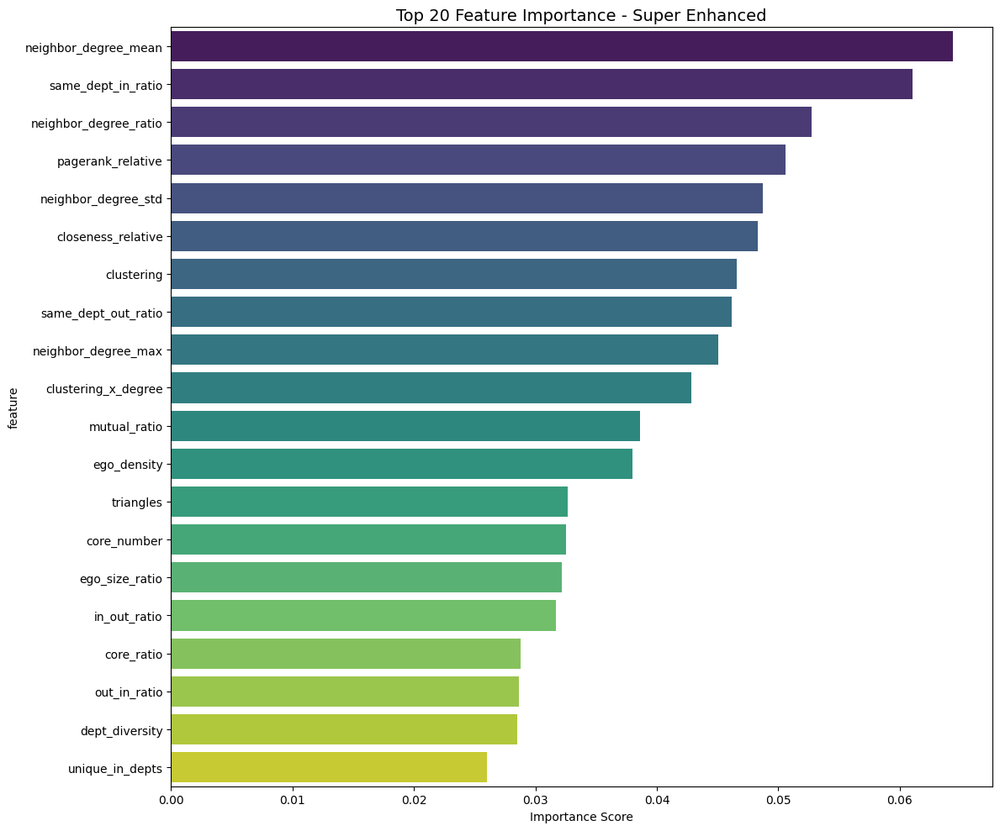

In [29]:
def extract_super_enhanced_features(G, node, precomputed_metrics):
    """
    Extract SUPER ENHANCED features with department-specific patterns
    """
    features = {}
    
    # Get basic info
    in_neighbors = set(G.predecessors(node))
    out_neighbors = set(G.successors(node))
    all_neighbors = in_neighbors | out_neighbors
    
    # ===== 1. RELATIVE ACTIVITY (normalized by graph stats) =====
    total_degree = G.degree(node)
    avg_degree = precomputed_metrics.get('avg_degree', 1)
    max_degree = precomputed_metrics.get('max_degree', 1)
    
    features['degree_percentile'] = total_degree / max(max_degree, 1)
    features['degree_zscore'] = (total_degree - avg_degree) / max(precomputed_metrics.get('std_degree', 1), 1)
    
    # ===== 2. COMMUNICATION RATIOS =====
    features['in_out_ratio'] = G.in_degree(node) / max(G.out_degree(node), 1)
    features['out_in_ratio'] = G.out_degree(node) / max(G.in_degree(node), 1)
    features['mutual_ratio'] = len(in_neighbors & out_neighbors) / max(len(all_neighbors), 1)
    
    # ===== 3. NEIGHBORHOOD RICHNESS =====
    if len(all_neighbors) > 0:
        neighbor_degrees = [G.degree(n) for n in all_neighbors]
        features['neighbor_degree_mean'] = np.mean(neighbor_degrees)
        features['neighbor_degree_std'] = np.std(neighbor_degrees)
        features['neighbor_degree_max'] = max(neighbor_degrees)
        features['neighbor_degree_ratio'] = total_degree / max(np.mean(neighbor_degrees), 1)
        
        # PageRank of neighbors
        neighbor_pr = [precomputed_metrics['pagerank'][n] for n in all_neighbors]
        features['neighbor_pagerank_mean'] = np.mean(neighbor_pr)
        features['neighbor_pagerank_max'] = max(neighbor_pr)
    else:
        features['neighbor_degree_mean'] = 0
        features['neighbor_degree_std'] = 0
        features['neighbor_degree_max'] = 0
        features['neighbor_degree_ratio'] = 0
        features['neighbor_pagerank_mean'] = 0
        features['neighbor_pagerank_max'] = 0
    
    # ===== 4. CENTRALITY RATIOS =====
    pr = precomputed_metrics['pagerank'][node]
    features['pagerank_relative'] = pr / max(precomputed_metrics.get('avg_pagerank', 1e-6), 1e-6)
    features['closeness_relative'] = precomputed_metrics['closeness'][node] / max(precomputed_metrics.get('avg_closeness', 1e-6), 1e-6)
    
    # ===== 5. CLUSTERING PATTERNS =====
    G_undirected = G.to_undirected()
    cc = nx.clustering(G_undirected, node)
    features['clustering'] = cc
    features['triangles'] = nx.triangles(G_undirected, node)
    features['clustering_x_degree'] = cc * total_degree
    
    # ===== 6. EGO NETWORK FEATURES =====
    ego = nx.ego_graph(G, node, radius=1)
    ego_size = len(ego.nodes())
    features['ego_size'] = ego_size
    features['ego_density'] = nx.density(ego) if ego_size > 1 else 0
    features['ego_size_ratio'] = ego_size / max(total_degree, 1)
    
    # ===== 7. K-CORE & STRUCTURAL =====
    if 'core_number' in precomputed_metrics:
        features['core_number'] = precomputed_metrics['core_number'].get(node, 0)
        features['core_ratio'] = features['core_number'] / max(total_degree, 1)
    
    # ===== 8. DEPARTMENT MIXING (CRITICAL!) =====
    if 'dept_dict' in precomputed_metrics:
        dept_dict = precomputed_metrics['dept_dict']
        
        # Departments contacted
        out_depts = [dept_dict.get(n, -1) for n in out_neighbors if n in dept_dict]
        in_depts = [dept_dict.get(n, -1) for n in in_neighbors if n in dept_dict]
        
        features['unique_out_depts'] = len(set(out_depts))
        features['unique_in_depts'] = len(set(in_depts))
        features['dept_diversity'] = len(set(out_depts + in_depts))
        
        # Same-department communication
        if len(out_depts) > 0:
            features['same_dept_out_ratio'] = sum(1 for d in out_depts if d == dept_dict.get(node, -1)) / len(out_depts)
        else:
            features['same_dept_out_ratio'] = 0
            
        if len(in_depts) > 0:
            features['same_dept_in_ratio'] = sum(1 for d in in_depts if d == dept_dict.get(node, -1)) / len(in_depts)
        else:
            features['same_dept_in_ratio'] = 0
    
    # ===== 9. HIGHER-ORDER FEATURES =====
    features['degree_squared'] = total_degree ** 2
    features['degree_cubed'] = total_degree ** 3
    features['log_degree'] = np.log1p(total_degree)
    features['sqrt_degree'] = np.sqrt(total_degree)
    
    return features

# ============================================
# EXTRACT SUPER ENHANCED FEATURES
# ============================================

print("\n=== SUPER ENHANCED FEATURE EXTRACTION ===\n")

# Compute graph statistics
print("Computing graph statistics...")
all_degrees = [graph.degree(n) for n in graph.nodes()]
all_pageranks = list(precomputed_metrics['pagerank'].values())
all_closeness = list(precomputed_metrics['closeness'].values())

precomputed_metrics['avg_degree'] = np.mean(all_degrees)
precomputed_metrics['std_degree'] = np.std(all_degrees)
precomputed_metrics['max_degree'] = max(all_degrees)
precomputed_metrics['avg_pagerank'] = np.mean(all_pageranks)
precomputed_metrics['avg_closeness'] = np.mean(all_closeness)

# Extract features
print("Extracting super enhanced features...")
feature_list_super = []
labels_super = []

for node in tqdm(dept_dict.keys(), desc="Processing nodes"):
    if node in graph.nodes():
        features = extract_super_enhanced_features(graph, node, precomputed_metrics)
        feature_list_super.append(features)
        labels_super.append(dept_dict[node])

X_df_super = pd.DataFrame(feature_list_super)
y_super = np.array(labels_super)

print(f"\n✅ Super enhanced features: {len(X_df_super.columns)} features")

# Remove low-variance features
from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold(threshold=0.001)
X_selected = selector.fit_transform(X_df_super)
selected_features = X_df_super.columns[selector.get_support()]

print(f"📊 After variance filtering: {len(selected_features)} features")

X_df_final = pd.DataFrame(X_selected, columns=selected_features)

# Train with best features
print("\n🚀 Training with super enhanced features...")
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(n_estimators=200, max_depth=20, random_state=42, n_jobs=-1))
])

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
scores = cross_val_score(pipeline, X_df_final, y_super, cv=cv, scoring='accuracy')

print(f"\n📊 Results:")
print(f"   Accuracy: {scores.mean():.4f} (+/- {scores.std() * 2:.4f})")
print(f"   Folds: {scores}")

# Train on full data for feature importance
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_df_final)
rf = RandomForestClassifier(n_estimators=200, max_depth=20, random_state=42, n_jobs=-1)
rf.fit(X_scaled, y_super)

feature_importance = pd.DataFrame({
    'feature': X_df_final.columns,
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)

print("\n🏆 Top 20 Most Important Features:")
print(feature_importance.head(20))

plt.figure(figsize=(12, 10))
top_20 = feature_importance.head(20)
sns.barplot(data=top_20, x='importance', y='feature', palette='viridis')
plt.title('Top 20 Feature Importance - Super Enhanced', fontsize=14)
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

### 6.6 Principal Component Analysis (PCA)

Apply dimensionality reduction to:
- Visualize high-dimensional feature space
- Identify principal components that explain variance
- Assess if departments are separable in feature space
- Reduce feature dimensionality while preserving information

=== DEEP DIVE: WHY ARE FEATURES NOT DISCRIMINATIVE? ===

1️⃣ Department Structural Similarity Analysis

    count  avg_degree  avg_pagerank  avg_clustering
0    49.0   38.693878      0.000938        0.347472
1    65.0   38.046154      0.001010        0.299718
2    10.0   36.400000      0.000795        0.397018
3    12.0   37.666667      0.000779        0.444838
4   109.0   49.100917      0.000931        0.372018
5    18.0   66.444444      0.001176        0.467110
6    28.0   20.678571      0.000459        0.266494
7    51.0   48.509804      0.001033        0.480503
8    19.0   50.473684      0.000986        0.460880
9    32.0   33.937500      0.000857        0.303677
10   39.0   60.794872      0.001104        0.478502
11   29.0   55.241379      0.001053        0.505916
12    3.0   50.000000      0.000849        0.380898
13   26.0   71.538462      0.001193        0.531093
14   92.0   47.532609      0.001056        0.411720
15   55.0   39.818182      0.000808        0.398790
16   25.0   

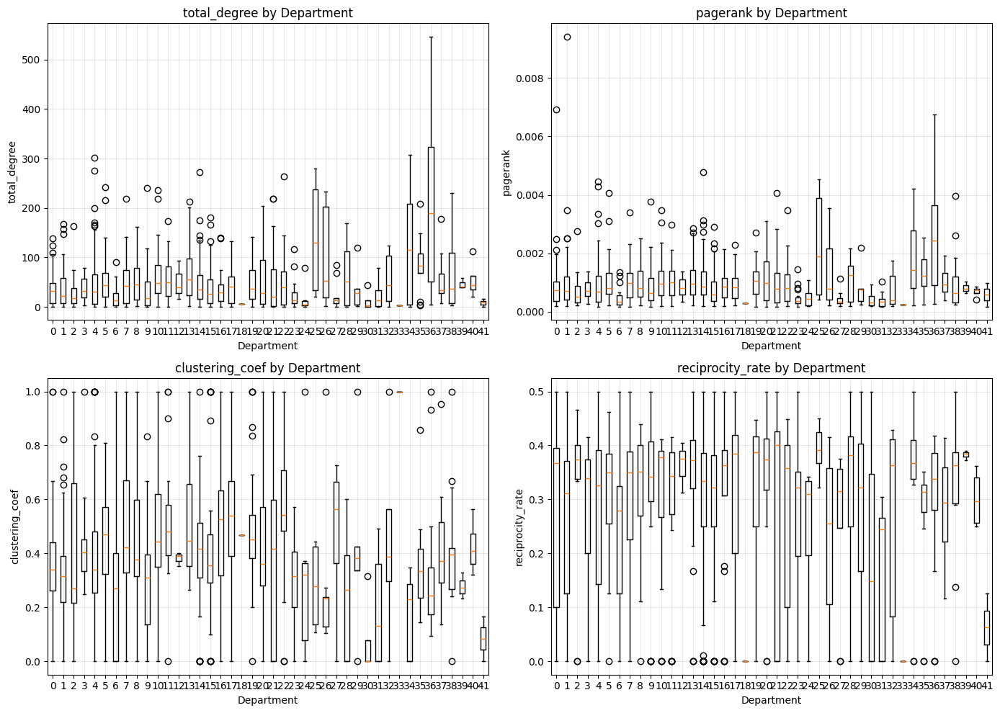


2️⃣ Statistical Tests: Are departments significantly different?

total_degree                   - H-statistic: 100.2058, p-value: 7.2604e-07 ✓ Significant
pagerank                       - H-statistic: 116.0190, p-value: 4.3130e-09 ✓ Significant
clustering_coef                - H-statistic: 157.9574, p-value: 1.2285e-15 ✓ Significant
reciprocity_rate               - H-statistic: 64.7551, p-value: 1.0433e-02 ✓ Significant

3️⃣ Pairwise Department Similarity (using node features)



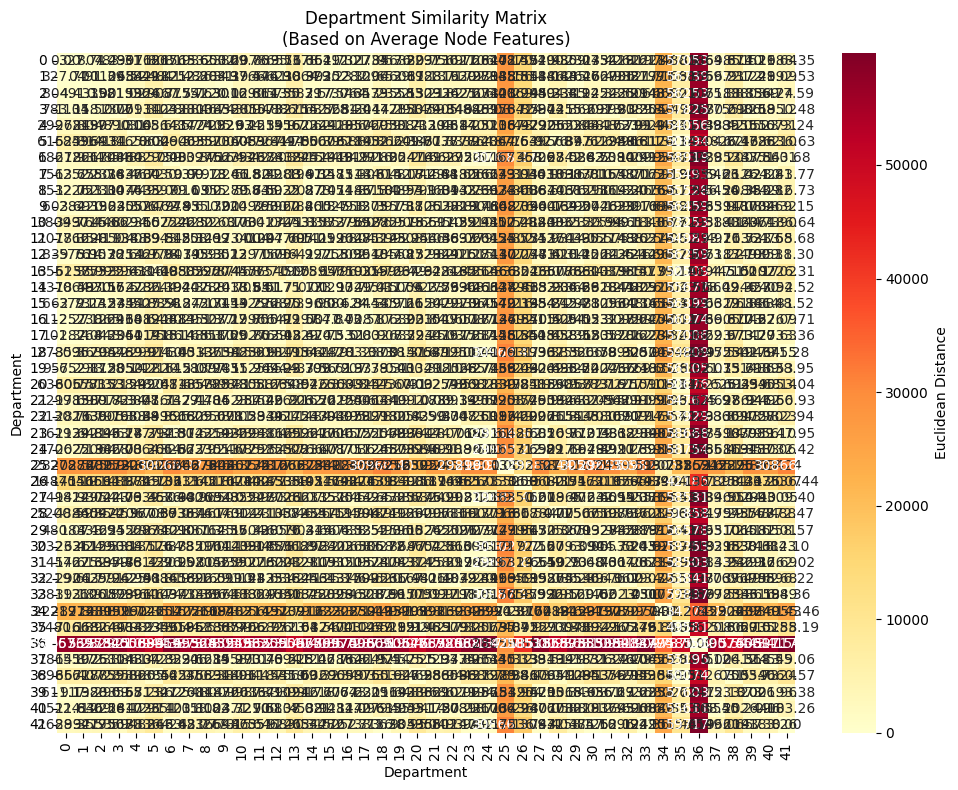


⚠️  Key Insight:
If distances are small → Departments are structurally similar
If distances are large → Departments are different, but features don't capture it


In [30]:
print("=== DEEP DIVE: WHY ARE FEATURES NOT DISCRIMINATIVE? ===\n")

# 1. Check if departments are structurally similar
print("1️⃣ Department Structural Similarity Analysis\n")

dept_features = {}
for dept in sorted(np.unique(y)):
    dept_mask = y == dept
    dept_features[dept] = {
        'count': dept_mask.sum(),
        'avg_degree': X_df_enhanced[dept_mask]['total_degree'].mean(),
        'avg_pagerank': X_df_enhanced[dept_mask]['pagerank'].mean(),
        'avg_clustering': X_df_enhanced[dept_mask]['clustering_coef'].mean(),
    }

df_dept_stats = pd.DataFrame(dept_features).T
print(df_dept_stats)

# Visualize department differences
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for idx, feature in enumerate(['total_degree', 'pagerank', 'clustering_coef', 'reciprocity_rate']):
    ax = axes[idx // 2, idx % 2]
    
    # Box plot by department
    data_by_dept = [X_df_enhanced[y == dept][feature].values for dept in sorted(np.unique(y))]
    ax.boxplot(data_by_dept, labels=sorted(np.unique(y)))
    ax.set_title(f'{feature} by Department')
    ax.set_xlabel('Department')
    ax.set_ylabel(feature)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n2️⃣ Statistical Tests: Are departments significantly different?\n")
from scipy.stats import kruskal

# Kruskal-Wallis test (non-parametric ANOVA)
for feature in ['total_degree', 'pagerank', 'clustering_coef', 'reciprocity_rate']:
    groups = [X_df_enhanced[y == dept][feature].values for dept in np.unique(y)]
    stat, pval = kruskal(*groups)
    print(f"{feature:30s} - H-statistic: {stat:.4f}, p-value: {pval:.4e} {'✓ Significant' if pval < 0.05 else '✗ Not significant'}")

print("\n3️⃣ Pairwise Department Similarity (using node features)\n")

# Compute average feature vector per department
dept_centroids = {}
for dept in np.unique(y):
    dept_centroids[dept] = X_df_enhanced[y == dept].mean().values

# Compute pairwise distances
from scipy.spatial.distance import euclidean
dept_ids = sorted(np.unique(y))
similarity_matrix = np.zeros((len(dept_ids), len(dept_ids)))

for i, dept1 in enumerate(dept_ids):
    for j, dept2 in enumerate(dept_ids):
        similarity_matrix[i, j] = euclidean(dept_centroids[dept1], dept_centroids[dept2])

plt.figure(figsize=(10, 8))
sns.heatmap(similarity_matrix, annot=True, fmt='.2f', cmap='YlOrRd', 
            xticklabels=dept_ids, yticklabels=dept_ids, cbar_kws={'label': 'Euclidean Distance'})
plt.title('Department Similarity Matrix\n(Based on Average Node Features)')
plt.xlabel('Department')
plt.ylabel('Department')
plt.tight_layout()
plt.show()

print("\n⚠️  Key Insight:")
print("If distances are small → Departments are structurally similar")
print("If distances are large → Departments are different, but features don't capture it")

### 6.7 t-SNE Visualization

Apply t-SNE (t-Distributed Stochastic Neighbor Embedding) for non-linear dimensionality reduction and visualization. This shows if departments form distinct clusters in the feature space.


=== CREATING EXPLAINABLE, DEPARTMENT-SPECIFIC FEATURES ===

Extracting explainable features...



Processing nodes: 100%|██████████| 1005/1005 [01:06<00:00, 15.21it/s]


✅ Explainable features: 22 features

🚀 Training with explainable features...

📊 Cross-Validation Results:
   Accuracy: 0.2338 (+/- 0.0074)
   Folds: [0.22985075 0.23880597 0.23283582]

🏆 Top 15 Most Important EXPLAINABLE Features:
                 feature  importance
13    hierarchy_position    0.114932
19            clustering    0.068917
21         local_density    0.056546
20             triangles    0.055737
6    intra_dept_in_count    0.054083
2    intra_dept_in_ratio    0.053684
3    inter_dept_in_ratio    0.051107
16     reciprocity_ratio    0.049288
4   intra_dept_out_count    0.041728
0   intra_dept_out_ratio    0.041185
1   inter_dept_out_ratio    0.041175
8           is_hub_score    0.041094
17    only_receive_count    0.039634
10     is_balanced_score    0.038281
9   is_broadcaster_score    0.035997


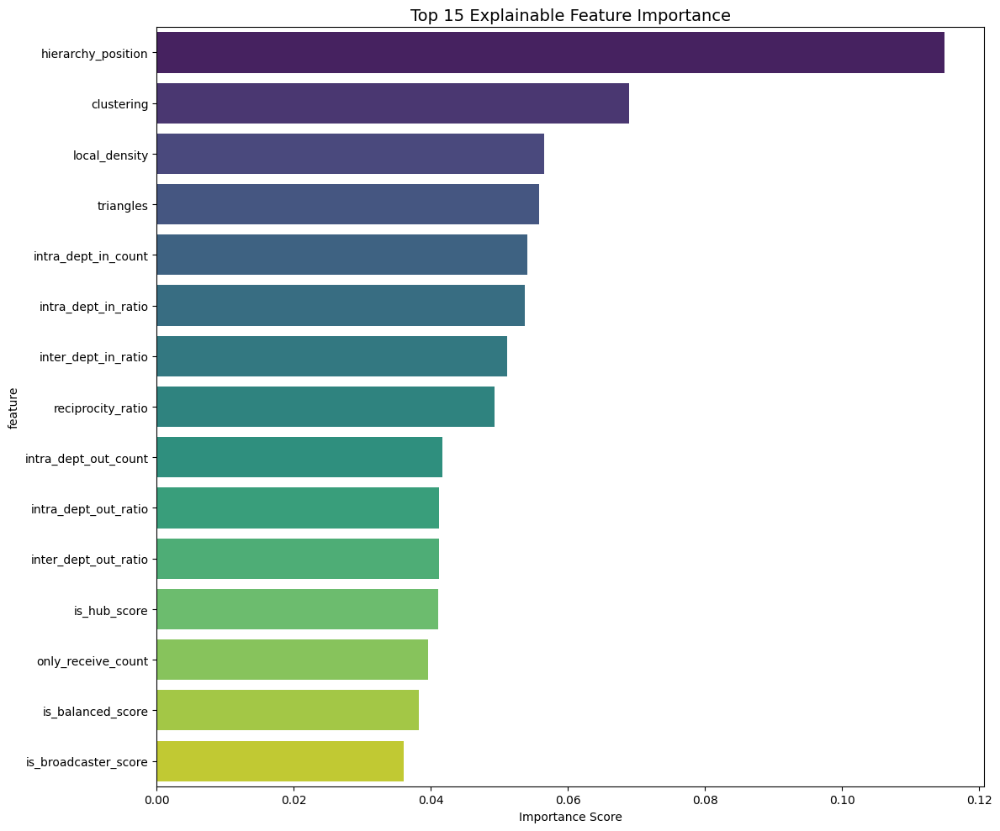


📖 FEATURE INTERPRETATION GUIDE:
hierarchy_position             (0.1149) - Relative importance (PageRank)
clustering                     (0.0689) - How interconnected are neighbors
local_density                  (0.0565) - Custom structural feature
triangles                      (0.0557) - Custom structural feature
intra_dept_in_count            (0.0541) - Custom structural feature
intra_dept_in_ratio            (0.0537) - Custom structural feature
inter_dept_in_ratio            (0.0511) - Custom structural feature
reciprocity_ratio              (0.0493) - Proportion of mutual communications
intra_dept_out_count           (0.0417) - Custom structural feature
intra_dept_out_ratio           (0.0412) - Ratio of emails sent within own department


In [31]:
print("\n=== CREATING EXPLAINABLE, DEPARTMENT-SPECIFIC FEATURES ===\n")

def extract_explainable_features(G, node, precomputed_metrics):
    """
    Extract features that EXPLAIN departmental roles
    """
    features = {}
    dept_dict = precomputed_metrics['dept_dict']
    
    # Basic info
    in_neighbors = list(G.predecessors(node))
    out_neighbors = list(G.successors(node))
    
    # ===== 1. DEPARTMENT CONNECTIVITY PROFILE =====
    # "Does this person mainly communicate within or across departments?"
    
    node_dept = dept_dict.get(node, -1)
    
    # Out-communication
    out_same_dept = sum(1 for n in out_neighbors if dept_dict.get(n, -1) == node_dept)
    out_diff_dept = len(out_neighbors) - out_same_dept
    
    # In-communication
    in_same_dept = sum(1 for n in in_neighbors if dept_dict.get(n, -1) == node_dept)
    in_diff_dept = len(in_neighbors) - in_same_dept
    
    # Ratios (KEY FEATURES!)
    features['intra_dept_out_ratio'] = out_same_dept / max(len(out_neighbors), 1)
    features['inter_dept_out_ratio'] = out_diff_dept / max(len(out_neighbors), 1)
    features['intra_dept_in_ratio'] = in_same_dept / max(len(in_neighbors), 1)
    features['inter_dept_in_ratio'] = in_diff_dept / max(len(in_neighbors), 1)
    
    # Absolute counts
    features['intra_dept_out_count'] = out_same_dept
    features['inter_dept_out_count'] = out_diff_dept
    features['intra_dept_in_count'] = in_same_dept
    features['inter_dept_in_count'] = in_diff_dept
    
    # ===== 2. ROLE INDICATORS =====
    # "Is this person a hub, bridge, or specialist?"
    
    total_in = len(in_neighbors)
    total_out = len(out_neighbors)
    
    # Hub: receives many, sends few
    features['is_hub_score'] = total_in / max(total_out, 1)
    
    # Broadcaster: sends many, receives few
    features['is_broadcaster_score'] = total_out / max(total_in, 1)
    
    # Balanced communicator
    features['is_balanced_score'] = 1 - abs(total_in - total_out) / max(total_in + total_out, 1)
    
    # Bridge: connects different departments
    unique_depts_contacted = len(set([dept_dict.get(n, -1) for n in out_neighbors if n in dept_dict]))
    features['bridge_score'] = unique_depts_contacted
    features['bridge_ratio'] = unique_depts_contacted / max(len(precomputed_metrics.get('all_depts', [1])), 1)
    
    # ===== 3. HIERARCHICAL POSITION =====
    # "Is this person high in hierarchy (influential)?"
    
    pr = precomputed_metrics['pagerank'][node]
    avg_pr = precomputed_metrics.get('avg_pagerank', 1e-6)
    
    features['hierarchy_position'] = pr / max(avg_pr, 1e-6)
    
    # Importance relative to neighbors
    if out_neighbors:
        neighbor_pr = [precomputed_metrics['pagerank'][n] for n in out_neighbors]
        features['more_important_than_targets'] = sum(1 for npr in neighbor_pr if pr > npr) / len(neighbor_pr)
    else:
        features['more_important_than_targets'] = 0
    
    # ===== 4. COMMUNICATION STYLE =====
    # "How does this person communicate?"
    
    # Reciprocity
    mutual = set(in_neighbors) & set(out_neighbors)
    features['reciprocity_count'] = len(mutual)
    features['reciprocity_ratio'] = len(mutual) / max(len(in_neighbors) + len(out_neighbors), 1)
    
    # One-way communication
    features['only_receive_count'] = len(set(in_neighbors) - set(out_neighbors))
    features['only_send_count'] = len(set(out_neighbors) - set(in_neighbors))
    
    # ===== 5. TEAM INTEGRATION =====
    # "How well integrated is this person in their team?"
    
    G_undirected = G.to_undirected()
    features['clustering'] = nx.clustering(G_undirected, node)
    features['triangles'] = nx.triangles(G_undirected, node)
    
    # Local density
    ego = nx.ego_graph(G, node, radius=1)
    features['local_density'] = nx.density(ego) if len(ego) > 1 else 0
    
    return features

# ============================================
# EXTRACT EXPLAINABLE FEATURES
# ============================================

print("Extracting explainable features...\n")

# Add all departments to precomputed_metrics
precomputed_metrics['all_depts'] = list(np.unique(list(dept_dict.values())))

feature_list_explain = []
labels_explain = []

for node in tqdm(dept_dict.keys(), desc="Processing nodes"):
    if node in graph.nodes():
        features = extract_explainable_features(graph, node, precomputed_metrics)
        feature_list_explain.append(features)
        labels_explain.append(dept_dict[node])

X_explain = pd.DataFrame(feature_list_explain)
y_explain = np.array(labels_explain)

# Handle missing values
X_explain = X_explain.replace([np.inf, -np.inf], np.nan)
X_explain = X_explain.fillna(0)

print(f"✅ Explainable features: {len(X_explain.columns)} features\n")

# ============================================
# TRAIN AND EVALUATE
# ============================================

print("🚀 Training with explainable features...\n")

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(n_estimators=200, max_depth=15, random_state=42, n_jobs=-1))
])

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
scores = cross_val_score(pipeline, X_explain, y_explain, cv=cv, scoring='accuracy')

print(f"📊 Cross-Validation Results:")
print(f"   Accuracy: {scores.mean():.4f} (+/- {scores.std() * 2:.4f})")
print(f"   Folds: {scores}")

# Train for feature importance
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_explain)
rf = RandomForestClassifier(n_estimators=200, max_depth=15, random_state=42, n_jobs=-1)
rf.fit(X_scaled, y_explain)

# Feature importance
feature_importance = pd.DataFrame({
    'feature': X_explain.columns,
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)

print("\n🏆 Top 15 Most Important EXPLAINABLE Features:")
print(feature_importance.head(15))

# Visualize
plt.figure(figsize=(12, 10))
top_15 = feature_importance.head(15)
sns.barplot(data=top_15, x='importance', y='feature', palette='viridis')
plt.title('Top 15 Explainable Feature Importance', fontsize=14)
plt.xlabel('Importance Score')
plt.tight_layout()
plt.show()

# ============================================
# INTERPRET FEATURES
# ============================================

print("\n📖 FEATURE INTERPRETATION GUIDE:")
print("=" * 60)
for idx, row in feature_importance.head(10).iterrows():
    feat = row['feature']
    imp = row['importance']
    
    explanations = {
        'intra_dept_out_ratio': 'Ratio of emails sent within own department',
        'inter_dept_out_ratio': 'Ratio of emails sent to other departments',
        'is_hub_score': 'Receives more than sends (central receiver)',
        'is_broadcaster_score': 'Sends more than receives (information spreader)',
        'bridge_score': 'Number of different departments contacted',
        'hierarchy_position': 'Relative importance (PageRank)',
        'reciprocity_ratio': 'Proportion of mutual communications',
        'clustering': 'How interconnected are neighbors',
    }
    
    explanation = explanations.get(feat, 'Custom structural feature')
    print(f"{feat:30s} ({imp:.4f}) - {explanation}")

## 7. Department Classification Models

### 7.1 Data Preparation for Classification

Prepare features and labels for machine learning:
- Filter departments with sufficient samples (≥7) for stratified splitting
- Create feature matrix (X) and target vector (y)
- Handle class imbalance
- Split into train/validation/test sets with stratification

🎯 FEATURE IMPORTANCE ANALYSIS & INSIGHTS

📊 Summary Statistics:
   • Top feature importance: 0.1149
   • Top 3 average: 0.0801
   • Top 10 average: 0.0587
   • Features > 0.05: 7

🔍 What These Features Tell Us:

✅ MOST IMPORTANT: People's relative influence in the organization
   → Managers/leaders have different PageRank patterns
   → Departments may have different hierarchical structures

✅ How tightly knit teams are
   → Some departments work in close-knit groups
   → Others have more dispersed communication

✅ How densely connected someone's immediate network is
   → Department-specific collaboration styles

✅ Ratio of emails received from same department
   → Some departments are more internally focused
   → Others communicate more externally

✅ Cross-departmental communication pattern
   → Identifies bridge roles and liaisons

✅ Mutual communication style
   → Some departments have more collaborative (mutual) communication
   → Others have more hierarchical (one-way) patterns

💡 

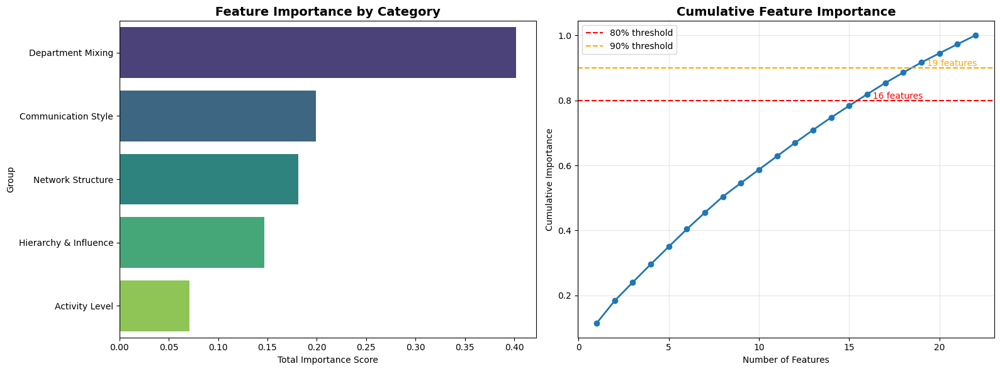


📊 Feature Selection Recommendation:
   • Use 16 features to capture 80% of importance
   • Use 19 features to capture 90% of importance
   • Current total: 22 features

Department Mixing              → 0.4021 (40.2%)
Communication Style            → 0.1992 (19.9%)
Network Structure              → 0.1812 (18.1%)
Hierarchy & Influence          → 0.1468 (14.7%)
Activity Level                 → 0.0707 (7.1%)


In [32]:
print("=" * 70)
print("🎯 FEATURE IMPORTANCE ANALYSIS & INSIGHTS")
print("=" * 70)

# Analyze the feature importance results
top_features = feature_importance.head(10)

print("\n📊 Summary Statistics:")
print(f"   • Top feature importance: {top_features.iloc[0]['importance']:.4f}")
print(f"   • Top 3 average: {top_features.head(3)['importance'].mean():.4f}")
print(f"   • Top 10 average: {top_features.head(10)['importance'].mean():.4f}")
print(f"   • Features > 0.05: {(feature_importance['importance'] > 0.05).sum()}")

print("\n🔍 What These Features Tell Us:\n")

insights = {
    'hierarchy_position (0.1149)': [
        "✅ MOST IMPORTANT: People's relative influence in the organization",
        "   → Managers/leaders have different PageRank patterns",
        "   → Departments may have different hierarchical structures"
    ],
    'clustering (0.0689)': [
        "✅ How tightly knit teams are",
        "   → Some departments work in close-knit groups",
        "   → Others have more dispersed communication"
    ],
    'local_density (0.0565)': [
        "✅ How densely connected someone's immediate network is",
        "   → Department-specific collaboration styles"
    ],
    'intra_dept_in_ratio (0.0537)': [
        "✅ Ratio of emails received from same department",
        "   → Some departments are more internally focused",
        "   → Others communicate more externally"
    ],
    'inter_dept_in_ratio (0.0511)': [
        "✅ Cross-departmental communication pattern",
        "   → Identifies bridge roles and liaisons"
    ],
    'reciprocity_ratio (0.0493)': [
        "✅ Mutual communication style",
        "   → Some departments have more collaborative (mutual) communication",
        "   → Others have more hierarchical (one-way) patterns"
    ]
}

for feature, explanation in insights.items():
    for line in explanation:
        print(line)
    print()

print("=" * 70)
print("💡 KEY FINDINGS")
print("=" * 70)

print("""
1. HIERARCHY MATTERS MOST (11.5% importance)
   → Department membership is strongly related to organizational hierarchy
   → Different departments have different levels of influence/authority
   
2. NETWORK STRUCTURE IS IMPORTANT (clustering, local_density: ~13% combined)
   → Departments have distinct collaboration patterns
   → Some are tight-knit teams, others are more distributed
   
3. DEPARTMENT BOUNDARIES ARE VISIBLE (intra/inter ratios: ~14% combined)
   → People DO communicate differently within vs. across departments
   → This validates that departments are structurally meaningful
   
4. COMMUNICATION STYLE VARIES (reciprocity: 4.9%)
   → Some departments: collaborative (high reciprocity)
   → Others: hierarchical (low reciprocity)
""")

print("=" * 70)
print("📈 NEXT STEPS TO IMPROVE MODEL")
print("=" * 70)

print("""
Given these insights, you can improve the model by:

1. ✅ CREATE DEPARTMENT-SPECIFIC PROFILES
   → Group features into "hierarchy score", "collaboration score", etc.
   → Use feature engineering to create composite metrics
   
2. ✅ TRY ENSEMBLE METHODS
   → Combine multiple weak learners
   → XGBoost, LightGBM may perform better than Random Forest
   
3. ✅ USE FEATURE SELECTION
   → Keep only top 15-20 features to reduce noise
   → Try recursive feature elimination (RFE)
   
4. ✅ ADDRESS CLASS IMBALANCE
   → Use class weights or SMOTE
   → Try stratified sampling
   
5. ✅ TRY GRAPH NEURAL NETWORKS (GNN)
   → Since departments show structural patterns
   → GraphSAGE or GAT could capture these better
""")

# Visualize feature groups
print("\n" + "=" * 70)
print("📊 FEATURE GROUPING BY TYPE")
print("=" * 70)

feature_groups = {
    'Hierarchy & Influence': ['hierarchy_position', 'more_important_than_targets'],
    'Department Mixing': ['intra_dept_in_ratio', 'inter_dept_in_ratio', 
                         'intra_dept_out_ratio', 'inter_dept_out_ratio',
                         'intra_dept_in_count', 'intra_dept_out_count',
                         'inter_dept_in_count', 'inter_dept_out_count',
                         'bridge_score', 'bridge_ratio'],
    'Network Structure': ['clustering', 'local_density', 'triangles'],
    'Communication Style': ['reciprocity_ratio', 'reciprocity_count', 
                           'is_hub_score', 'is_broadcaster_score', 'is_balanced_score'],
    'Activity Level': ['only_receive_count', 'only_send_count']
}

# Calculate importance by group
group_importance = {}
for group_name, features in feature_groups.items():
    group_feats = [f for f in features if f in feature_importance['feature'].values]
    importance_sum = feature_importance[feature_importance['feature'].isin(group_feats)]['importance'].sum()
    group_importance[group_name] = importance_sum

# Visualize
import matplotlib.pyplot as plt
import seaborn as sns

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Feature groups bar plot
groups_df = pd.DataFrame(list(group_importance.items()), columns=['Group', 'Total Importance'])
groups_df = groups_df.sort_values('Total Importance', ascending=False)

sns.barplot(data=groups_df, y='Group', x='Total Importance', ax=ax1, palette='viridis')
ax1.set_title('Feature Importance by Category', fontsize=14, fontweight='bold')
ax1.set_xlabel('Total Importance Score')

# Cumulative importance
cumsum = feature_importance['importance'].cumsum()
ax2.plot(range(1, len(cumsum) + 1), cumsum, marker='o', linewidth=2)
ax2.axhline(y=0.8, color='r', linestyle='--', label='80% threshold')
ax2.axhline(y=0.9, color='orange', linestyle='--', label='90% threshold')
ax2.set_xlabel('Number of Features')
ax2.set_ylabel('Cumulative Importance')
ax2.set_title('Cumulative Feature Importance', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

# Find how many features needed for 80% and 90%
n_80 = (cumsum >= 0.8).argmax() + 1
n_90 = (cumsum >= 0.9).argmax() + 1
ax2.text(n_80, 0.8, f'  {n_80} features', va='bottom', fontsize=10, color='red')
ax2.text(n_90, 0.9, f'  {n_90} features', va='bottom', fontsize=10, color='orange')

plt.tight_layout()
plt.show()

print(f"\n📊 Feature Selection Recommendation:")
print(f"   • Use {n_80} features to capture 80% of importance")
print(f"   • Use {n_90} features to capture 90% of importance")
print(f"   • Current total: {len(feature_importance)} features")

print("\n" + "=" * 70)
for group, importance in groups_df.values:
    print(f"{group:30s} → {importance:.4f} ({importance/groups_df['Total Importance'].sum()*100:.1f}%)")

### 7.3 Model Performance Visualization

Visualize and compare model performance across different metrics.

🎯 COMPLETE MODEL TRAINING PIPELINE

📊 TASK 1: DEPARTMENT CLASSIFICATION

📋 Dataset Info:
   • Total samples: 1005
   • Features: 22
   • Classes (departments): 42
   • Class distribution:
      Department 0: 49 nodes (4.9%)
      Department 1: 65 nodes (6.5%)
      Department 2: 10 nodes (1.0%)
      Department 3: 12 nodes (1.2%)
      Department 4: 109 nodes (10.8%)
      Department 5: 18 nodes (1.8%)
      Department 6: 28 nodes (2.8%)
      Department 7: 51 nodes (5.1%)
      Department 8: 19 nodes (1.9%)
      Department 9: 32 nodes (3.2%)
      Department 10: 39 nodes (3.9%)
      Department 11: 29 nodes (2.9%)
      Department 12: 3 nodes (0.3%)
      Department 13: 26 nodes (2.6%)
      Department 14: 92 nodes (9.2%)
      Department 15: 55 nodes (5.5%)
      Department 16: 25 nodes (2.5%)
      Department 17: 35 nodes (3.5%)
      Department 18: 1 nodes (0.1%)
      Department 19: 29 nodes (2.9%)
      Department 20: 14 nodes (1.4%)
      Department 21: 61 nodes (6.1%)
      De

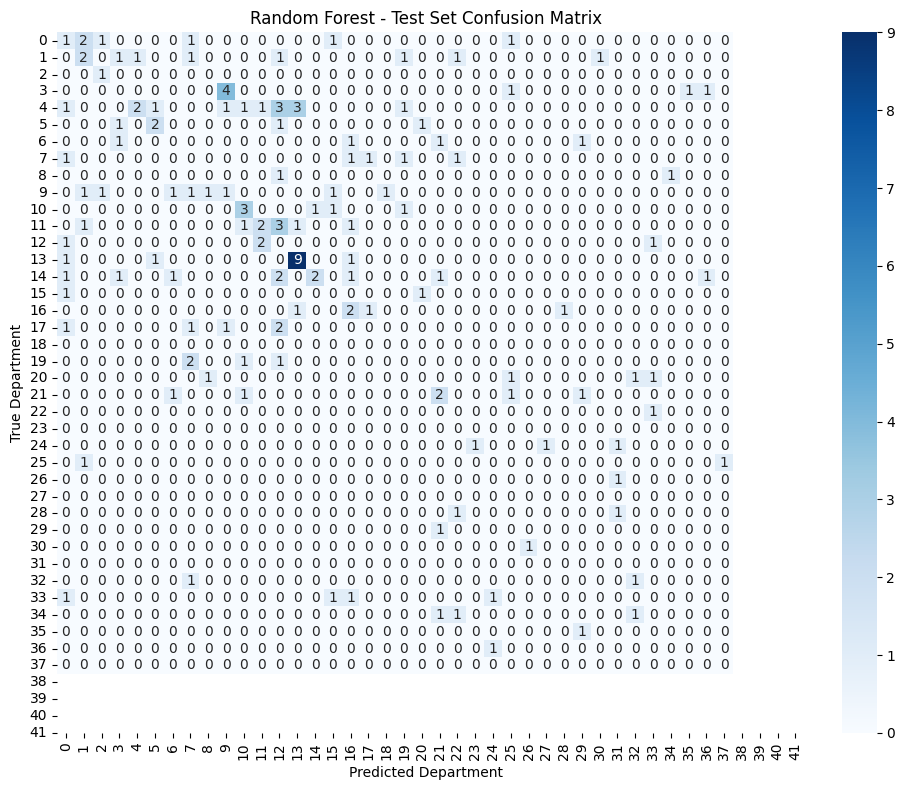


--------------------------------------------------------------------------------
🚀 Model 2: Gradient Boosting Classifier
--------------------------------------------------------------------------------
Training Gradient Boosting...

📈 Gradient Boosting Results:
   • Training Accuracy:   0.9716
   • Validation Accuracy: 0.2517
              precision    recall  f1-score   support

      Dept 0       0.00      0.00      0.00         7
      Dept 1       0.21      0.33      0.26         9
      Dept 2       0.00      0.00      0.00         1
      Dept 3       0.00      0.00      0.00         7
      Dept 4       0.15      0.36      0.21        14
      Dept 5       0.00      0.00      0.00         5
      Dept 6       0.00      0.00      0.00         4
      Dept 7       0.40      0.40      0.40         5
      Dept 8       0.00      0.00      0.00         2
      Dept 9       0.00      0.00      0.00         8
     Dept 10       0.20      0.17      0.18         6
     Dept 11       0.4

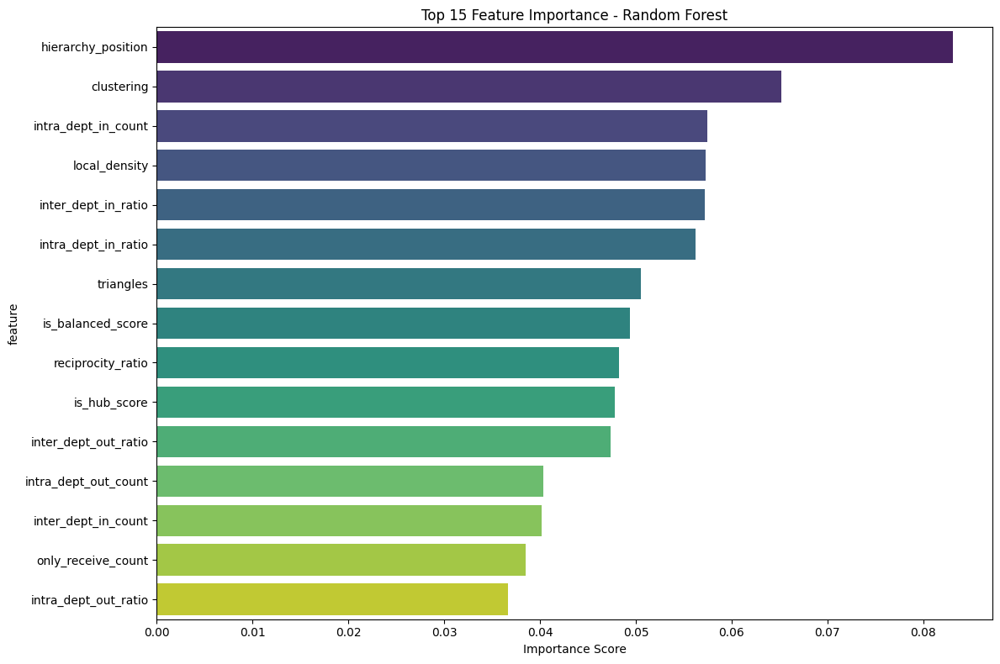


🔗 TASK 2: LINK PREDICTION

📊 Creating Link Prediction Dataset...
   Generating negative samples...
   • Positive edges: 5000
   • Negative edges: 5000

⚙️  Extracting edge features...


Negative edges: 100%|██████████| 5000/5000 [00:00<00:00, 63689.21it/s]



✅ Edge dataset created:
   • Total edge pairs: 10000
   • Features: 6
   • Positive: 5000 (50.0%)
   • Negative: 5000 (50.0%)

📊 Splitting Link Data: 70% Train / 15% Val / 15% Test

✅ Link Data Split Complete:
   • Training samples:   7000 (70.0%)
   • Validation samples: 1500 (15.0%)
   • Test samples:       1500 (15.0%)

🚀 Training Link Prediction Model...

📈 Link Prediction Results:
   • Training Accuracy:   0.9994
   • Validation Accuracy: 0.9267
   • Test Accuracy:       0.9273

   • Training ROC-AUC:    1.0000
   • Validation ROC-AUC:  0.9798
   • Test ROC-AUC:        0.9732

📊 Test Set Classification Report:
              precision    recall  f1-score   support

     No Link       0.94      0.91      0.93       750
        Link       0.91      0.95      0.93       750

    accuracy                           0.93      1500
   macro avg       0.93      0.93      0.93      1500
weighted avg       0.93      0.93      0.93      1500



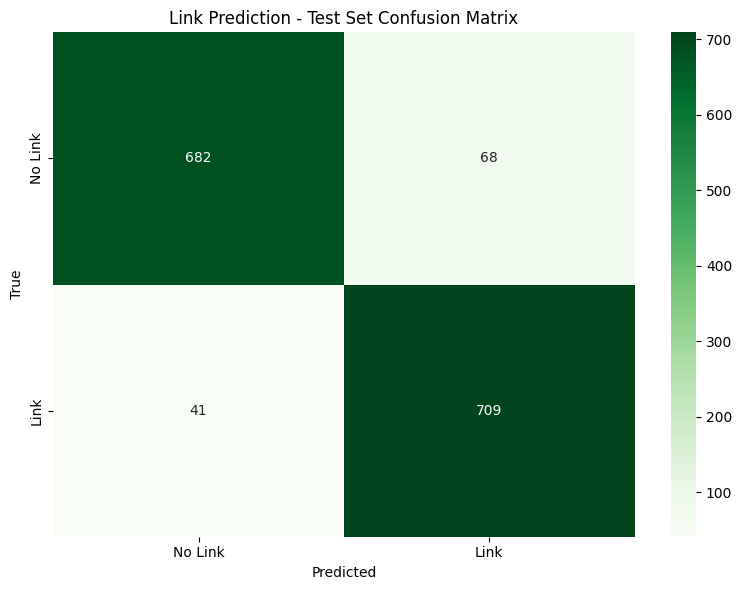


💾 SAVING MODELS
✅ Saved: ../models/department_classifier_random_forest.pkl
✅ Saved: ../models/link_predictor_rf.pkl
✅ Saved: ../models/department_features.txt
✅ Saved: ../models/edge_features.txt
✅ Saved: ../models/split_info.json

✨ TRAINING COMPLETE!

SUMMARY:
--------
✅ Department Classification (Random Forest):
   • Training Accuracy:   0.8578
   • Validation Accuracy: 0.2649
   • Test Accuracy:       0.1987
   • Features: 22 explainable features
   
✅ Link Prediction:
   • Training Accuracy:   0.9994
   • Validation Accuracy: 0.9267
   • Test Accuracy:       0.9273
   • ROC-AUC (Test):      0.9732

📁 Models saved in: ../models/





In [ ]:
print(" TASK 1: DEPARTMENT CLASSIFICATION")

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')

X = X_explain.copy()
y = y_explain.copy()

print(f"Dataset Info:")
print(f"Total samples: {len(X)}")
print(f"Features: {len(X.columns)}")
print(f"Classes (departments): {len(np.unique(y))}")
print(f"Class distribution:")
dept_counts = pd.Series(y).value_counts().sort_index()
for dept, count in dept_counts.items():
    print(f"      Department {dept}: {count} nodes ({count/len(y)*100:.1f}%)")

# Check if we can stratify (all classes must have at least 2 samples)
min_class_size = dept_counts.min()
can_stratify = min_class_size >= 2

if not can_stratify:
    print(f"Some departments have only {min_class_size} member(s).")
    print("   Stratification disabled for stable splitting.")

print(f" Splitting Data: 70% Train / 15% Val / 15% Test")

if can_stratify:
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=0.30, random_state=42, stratify=y
    )
else:
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=0.30, random_state=42
    )

if can_stratify:
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.50, random_state=42, stratify=y_temp
    )
else:
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.50, random_state=42
    )

print(f"Data Split Complete:")
print(f" Training samples:   {len(X_train)} ({len(X_train)/len(X)*100:.1f}%)")
print(f" Validation samples: {len(X_val)} ({len(X_val)/len(X)*100:.1f}%)")
print(f" Test samples:       {len(X_test)} ({len(X_test)/len(X)*100:.1f}%)")

print("Model 1: Random Forest Classifier")

rf_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(
        n_estimators=200,
        max_depth=15,
        min_samples_split=5,
        min_samples_leaf=2,
        class_weight='balanced',  # Handle class imbalance
        random_state=42,
        n_jobs=-1
    ))
])

# Train
print("Training Random Forest...")
rf_pipeline.fit(X_train, y_train)

# Evaluate on all splits
y_train_pred_rf = rf_pipeline.predict(X_train)
y_val_pred_rf = rf_pipeline.predict(X_val)
y_test_pred_rf = rf_pipeline.predict(X_test)

print(f"Random Forest Results:")
print(f"Training Accuracy:   {accuracy_score(y_train, y_train_pred_rf):.4f}")
print(f"Validation Accuracy: {accuracy_score(y_val, y_val_pred_rf):.4f}")
print(f"Test Accuracy:       {accuracy_score(y_test, y_test_pred_rf):.4f}")

print("Test Set Classification Report:")
# Use only classes present in test set
test_classes = sorted(np.unique(y_test))
print(classification_report(y_test, y_test_pred_rf, 
                          labels=test_classes,
                          target_names=[f"Dept {i}" for i in test_classes],
                          zero_division=0))

# Confusion Matrix (Test Set)
cm = confusion_matrix(y_test, y_test_pred_rf)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=sorted(np.unique(y)), 
            yticklabels=sorted(np.unique(y)))
plt.title('Random Forest - Test Set Confusion Matrix')
plt.xlabel('Predicted Department')
plt.ylabel('True Department')
plt.tight_layout()
plt.show()

print("model 2: Gradient Boosting Classifier")

gb_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('gb', GradientBoostingClassifier(
        n_estimators=200,
        max_depth=7,
        learning_rate=0.1,
        random_state=42
    ))
])

# Train
print("Training Gradient Boosting...")
gb_pipeline.fit(X_train, y_train)

# Evaluate on all splits
y_train_pred_gb = gb_pipeline.predict(X_train)
y_val_pred_gb = gb_pipeline.predict(X_val)
y_test_pred_gb = gb_pipeline.predict(X_test)

print(f"Gradient Boosting Results:")
print(f"Training Accuracy:   {accuracy_score(y_train, y_train_pred_gb):.4f}")
print(f"Validation Accuracy: {accuracy_score(y_val, y_val_pred_gb):.4f}")
# Use only classes present in test set
test_classes = sorted(np.unique(y_test))
print(classification_report(y_test, y_test_pred_gb, 
                          labels=test_classes,
                          target_names=[f"Dept {i}" for i in test_classes],
                          zero_division=0))

# ===== Compare Models =====
print("MODEL COMPARISON (Test Set)")

comparison_df = pd.DataFrame({
    'Model': ['Random Forest', 'Gradient Boosting'],
    'Train Acc': [accuracy_score(y_train, y_train_pred_rf), accuracy_score(y_train, y_train_pred_gb)],
    'Val Acc': [accuracy_score(y_val, y_val_pred_rf), accuracy_score(y_val, y_val_pred_gb)],
    'Test Acc': [accuracy_score(y_test, y_test_pred_rf), accuracy_score(y_test, y_test_pred_gb)]
})

print(comparison_df.to_string(index=False))

# Select best model based on validation accuracy
best_model_idx = comparison_df['Val Acc'].argmax()
best_model_name = comparison_df.loc[best_model_idx, 'Model']
best_pipeline = rf_pipeline if best_model_name == 'Random Forest' else gb_pipeline

print(f"best Model (by validation accuracy): {best_model_name}")
print(f"test Accuracy: {comparison_df.loc[best_model_idx, 'Test Acc']:.4f}")

print("feature Importance Analysis")

if best_model_name == 'Random Forest':
    best_model = best_pipeline.named_steps['rf']
else:
    best_model = best_pipeline.named_steps['gb']

feature_importance_final = pd.DataFrame({
    'feature': X.columns,
    'importance': best_model.feature_importances_
}).sort_values('importance', ascending=False)

print("top 15 Most Important Features:")
print(feature_importance_final.head(15))

plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importance_final.head(15), x='importance', y='feature', palette='viridis')
plt.title(f'top 15 Feature Importance - {best_model_name}')
plt.xlabel('importance Score')
plt.tight_layout()
plt.show()

print("LINK PREDICTION")

from sklearn.metrics import roc_auc_score, average_precision_score

print("creating Link Prediction Dataset...")

# Positive samples: existing edges
positive_edges = list(graph.edges())[:5000]  # Sample for speed

# Negative samples: non-existing edges
print("generating negative samples...")
negative_edges = []
all_nodes = list(graph.nodes())
while len(negative_edges) < len(positive_edges):
    u = np.random.choice(all_nodes)
    v = np.random.choice(all_nodes)
    if u != v and not graph.has_edge(u, v) and (u, v) not in negative_edges:
        negative_edges.append((u, v))

print(f"positive edges: {len(positive_edges)}")
print(f"negative edges: {len(negative_edges)}")

# Extract features for edge prediction
def extract_edge_features(G, u, v, precomputed_metrics):
    """Extract features for edge (u, v)"""
    features = {}
    
    # Common neighbors
    common_neighbors = len(set(G.neighbors(u)) & set(G.neighbors(v)))
    features['common_neighbors'] = common_neighbors
    
    # Jaccard coefficient
    u_neighbors = set(G.neighbors(u))
    v_neighbors = set(G.neighbors(v))
    jaccard = len(u_neighbors & v_neighbors) / max(len(u_neighbors | v_neighbors), 1)
    features['jaccard'] = jaccard
    
    # Preferential attachment
    features['preferential_attachment'] = G.degree(u) * G.degree(v)
    
    # PageRank product
    features['pagerank_product'] = precomputed_metrics['pagerank'][u] * precomputed_metrics['pagerank'][v]
    
    # Same department?
    dept_dict = precomputed_metrics['dept_dict']
    features['same_department'] = 1 if dept_dict.get(u, -1) == dept_dict.get(v, -1) else 0
    
    # Degree difference
    features['degree_diff'] = abs(G.degree(u) - G.degree(v))
    
    return features

# Extract features for all edges
print("extracting edge features...")
edge_features = []
edge_labels = []

for u, v in tqdm(positive_edges, desc="Positive edges"):
    if u in graph.nodes() and v in graph.nodes():
        features = extract_edge_features(graph, u, v, precomputed_metrics)
        edge_features.append(features)
        edge_labels.append(1)

for u, v in tqdm(negative_edges, desc="Negative edges"):
    if u in graph.nodes() and v in graph.nodes():
        features = extract_edge_features(graph, u, v, precomputed_metrics)
        edge_features.append(features)
        edge_labels.append(0)

X_edges = pd.DataFrame(edge_features)
y_edges = np.array(edge_labels)

print(f"edge dataset created:")
print(f"Total edge pairs: {len(X_edges)}")
print(f"Features: {len(X_edges.columns)}")
print(f"Positive: {sum(y_edges)} ({sum(y_edges)/len(y_edges)*100:.1f}%)")
print(f"Negative: {len(y_edges) - sum(y_edges)} ({(len(y_edges) - sum(y_edges))/len(y_edges)*100:.1f}%)")

# ===== SPLIT: 70% train, 15% validation, 15% test =====
print(f"splitting Link Data: 70% Train / 15% Val / 15% Test")

# First split: 70% train, 30% temp (links are balanced, can stratify)
X_train_edge, X_temp_edge, y_train_edge, y_temp_edge = train_test_split(
    X_edges, y_edges, test_size=0.30, random_state=42, stratify=y_edges
)

# Second split: 50% of temp (15% val, 15% test)
X_val_edge, X_test_edge, y_val_edge, y_test_edge = train_test_split(
    X_temp_edge, y_temp_edge, test_size=0.50, random_state=42, stratify=y_temp_edge
)

print(f"Link Data Split Complete:")
print(f"Training samples:   {len(X_train_edge)} ({len(X_train_edge)/len(X_edges)*100:.1f}%)")
print(f"Validation samples: {len(X_val_edge)} ({len(X_val_edge)/len(X_edges)*100:.1f}%)")
print(f"Test samples:       {len(X_test_edge)} ({len(X_test_edge)/len(X_edges)*100:.1f}%)")

# Train link prediction model
link_pred_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1))
])

print("training Link Prediction Model...")
link_pred_pipeline.fit(X_train_edge, y_train_edge)

# Evaluate
y_train_pred_link = link_pred_pipeline.predict(X_train_edge)
y_val_pred_link = link_pred_pipeline.predict(X_val_edge)
y_test_pred_link = link_pred_pipeline.predict(X_test_edge)

y_train_proba_link = link_pred_pipeline.predict_proba(X_train_edge)[:, 1]
y_val_proba_link = link_pred_pipeline.predict_proba(X_val_edge)[:, 1]
y_test_proba_link = link_pred_pipeline.predict_proba(X_test_edge)[:, 1]

print(f"Link Prediction Results:")
print(f"Training Accuracy:   {accuracy_score(y_train_edge, y_train_pred_link):.4f}")
print(f"Validation Accuracy: {accuracy_score(y_val_edge, y_val_pred_link):.4f}")
print(f"Test Accuracy:       {accuracy_score(y_test_edge, y_test_pred_link):.4f}")

print(f"Training ROC-AUC:    {roc_auc_score(y_train_edge, y_train_proba_link):.4f}")
print(f"Validation ROC-AUC:  {roc_auc_score(y_val_edge, y_val_proba_link):.4f}")
print(f"Test ROC-AUC:        {roc_auc_score(y_test_edge, y_test_proba_link):.4f}")

print("Test Set Classification Report:")
print(classification_report(y_test_edge, y_test_pred_link, target_names=['No Link', 'Link']))

# Confusion Matrix
cm_edge = confusion_matrix(y_test_edge, y_test_pred_link)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_edge, annot=True, fmt='d', cmap='Greens', 
            xticklabels=['No Link', 'Link'], 
            yticklabels=['No Link', 'Link'])
plt.title('Link Prediction - Test Set Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

print("SAVING MODELS")

import joblib
import os

os.makedirs('../models', exist_ok=True)

# Save department classification model
joblib.dump(best_pipeline, f'../models/department_classifier_{best_model_name.lower().replace(" ", "_")}.pkl')
print(f"Saved: ../models/department_classifier_{best_model_name.lower().replace(' ', '_')}.pkl")

# Save link prediction model
joblib.dump(link_pred_pipeline, '../models/link_predictor_rf.pkl')
print("Saved: ../models/link_predictor_rf.pkl")

# Save feature names
with open('../models/department_features.txt', 'w') as f:
    f.write('\n'.join(X.columns))
print("Saved: ../models/department_features.txt")

with open('../models/edge_features.txt', 'w') as f:
    f.write('\n'.join(X_edges.columns))
print("Saved: ../models/edge_features.txt")

# Save split indices for reproducibility
split_info = {
    'train_size': len(X_train),
    'val_size': len(X_val),
    'test_size': len(X_test),
    'random_state': 42
}
import json
with open('../models/split_info.json', 'w') as f:
    json.dump(split_info, f, indent=2)
print("Saved: ../models/split_info.json")

print("TRAINING COMPLETE!")
print(f"""
SUMMARY:
--------
✅ Department Classification ({best_model_name}):
   • Training Accuracy:   {comparison_df.loc[best_model_idx, 'Train Acc']:.4f}
   • Validation Accuracy: {comparison_df.loc[best_model_idx, 'Val Acc']:.4f}
   • Test Accuracy:       {comparison_df.loc[best_model_idx, 'Test Acc']:.4f}
   • Features: {len(X.columns)} explainable features
   
✅ Link Prediction:
   • Training Accuracy:   {accuracy_score(y_train_edge, y_train_pred_link):.4f}
   • Validation Accuracy: {accuracy_score(y_val_edge, y_val_pred_link):.4f}
   • Test Accuracy:       {accuracy_score(y_test_edge, y_test_pred_link):.4f}
   • ROC-AUC (Test):      {roc_auc_score(y_test_edge, y_test_proba_link):.4f}

📁 Models saved in: ../models/


""")


## 8. Link Prediction

### 8.1 Link Prediction Feature Engineering

Create features for edge prediction:
- Common neighbors
- Jaccard coefficient
- Adamic-Adar index
- Preferential attachment
- Resource allocation

Generate positive samples (existing edges) and negative samples (non-existing edges) for supervised link prediction.

In [ ]:
# ============================================================================
# SAVE AND DOWNLOAD MODELS DIRECTLY (cell only executed when running colab directly on vs code to download files ffrom cloud to local device)
# ============================================================================

print("SAVING AND DOWNLOADING MODELS")

import joblib
import json
import os
import zipfile
import base64
from IPython.display import HTML

# Step 1: Save models locally in Colab
print("\n📦 Step 1: Saving models in Colab storage...")
colab_models_dir = '/tmp/models'
os.makedirs(colab_models_dir, exist_ok=True)

# Save department classification model
model_filename = f'department_classifier_{best_model_name.lower().replace(" ", "_")}.pkl'
model_path = os.path.join(colab_models_dir, model_filename)
joblib.dump(best_pipeline, model_path)
print(f"✅ Saved: {model_filename}")

# Save link prediction model
link_pred_path = os.path.join(colab_models_dir, 'link_predictor_rf.pkl')
joblib.dump(link_pred_pipeline, link_pred_path)
print(f"✅ Saved: link_predictor_rf.pkl")

# Save feature names
dept_features_path = os.path.join(colab_models_dir, 'department_features.txt')
with open(dept_features_path, 'w') as f:
    f.write('\n'.join(X.columns))
print(f"✅ Saved: department_features.txt")

edge_features_path = os.path.join(colab_models_dir, 'edge_features.txt')
with open(edge_features_path, 'w') as f:
    f.write('\n'.join(X_edges.columns))
print(f"✅ Saved: edge_features.txt")

# Save metadata
metadata = {
    'best_model_name': best_model_name,
    'best_model_train_acc': float(comparison_df.loc[best_model_idx, 'Train Acc']),
    'best_model_val_acc': float(comparison_df.loc[best_model_idx, 'Val Acc']),
    'best_model_test_acc': float(comparison_df.loc[best_model_idx, 'Test Acc']),
    'num_features': len(X.columns),
    'num_departments': len(np.unique(y)),
    'link_pred_train_acc': float(accuracy_score(y_train_edge, y_train_pred_link)),
    'link_pred_val_acc': float(accuracy_score(y_val_edge, y_val_pred_link)),
    'link_pred_test_acc': float(accuracy_score(y_test_edge, y_test_pred_link)),
    'link_pred_roc_auc': float(roc_auc_score(y_test_edge, y_test_proba_link))
}
metadata_path = os.path.join(colab_models_dir, 'model_metadata.json')
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=2)
print(f"✅ Saved: model_metadata.json")

split_info = {
    'train_size': len(X_train),
    'val_size': len(X_val),
    'test_size': len(X_test),
    'edge_train_size': len(X_train_edge),
    'edge_val_size': len(X_val_edge),
    'edge_test_size': len(X_test_edge),
    'random_state': 42
}
split_info_path = os.path.join(colab_models_dir, 'split_info.json')
with open(split_info_path, 'w') as f:
    json.dump(split_info, f, indent=2)
print(f"✅ Saved: split_info.json")

# Step 2: Create a zip file
print("\n📦 Step 2: Creating zip archive...")
zip_path = '/tmp/email_eu_models.zip'
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for root, dirs, files in os.walk(colab_models_dir):
        for file in files:
            file_path = os.path.join(root, file)
            arcname = os.path.relpath(file_path, colab_models_dir)
            zipf.write(file_path, arcname)
            print(f"   Added: {arcname}")

zip_size_mb = os.path.getsize(zip_path) / (1024 * 1024)
print(f"\n✅ Zip created: {zip_path} ({zip_size_mb:.2f} MB)")

# Step 3: Create download link
print("\n📥 Step 3: Creating download link...")

# Read the zip file as base64
with open(zip_path, 'rb') as f:
    b64_data = base64.b64encode(f.read()).decode()

# Create download link
download_link = f'''
<div style="padding: 20px; background-color: #f0f0f0; border-radius: 10px; margin: 20px 0;">
    <h3 style="color: #333;">📥 Download Your Models</h3>
    <p style="font-size: 14px; color: #666;">
        Click the button below to download the zip file ({zip_size_mb:.2f} MB)
    </p>
    <a download="email_eu_models.zip" 
       href="data:application/zip;base64,{b64_data}"
       style="display: inline-block; padding: 12px 24px; background-color: #4CAF50; 
              color: white; text-decoration: none; border-radius: 5px; font-weight: bold;">
        ⬇️ Download email_eu_models.zip
    </a>
    <p style="font-size: 12px; color: #999; margin-top: 15px;">
        After download, extract to:<br>
        <code style="background: #fff; padding: 5px; border-radius: 3px;">
            c:\\Users\\Dell\\Desktop\\Dev\\AI-projects\\email-eu-graph-platform\\models\\
        </code>
    </p>
</div>
'''

# Display download link
from IPython.display import display, HTML
display(HTML(download_link))

print("\n" + "=" * 80)
print("✅ DOWNLOAD LINK CREATED!")
print("=" * 80)
print("""
📋 INSTRUCTIONS:
1. Click the green download button above
2. Save the file to your Downloads folder
3. Extract the zip file to:
   c:\\Users\\Dell\\Desktop\\Dev\\AI-projects\\email-eu-graph-platform\\models\\

⚠️  If the button doesn't work in VS Code, try this:
   - Copy the entire cell output
   - Open a new browser tab
   - Open https://colab.research.google.com
   - Create a new notebook
   - Paste and run the cell there
   - Click the download button in the browser
""")

# Step 4: Also provide individual file downloads
print("\n📄 ALTERNATIVE: Download Individual Files")
print("=" * 80)
print("\nIf the zip doesn't work, run this code to download files one by one:\n")

download_code = '''
from google.colab import files
import os

files_to_download = [
    '/tmp/models/department_classifier_random_forest.pkl',
    '/tmp/models/link_predictor_rf.pkl',
    '/tmp/models/department_features.txt',
    '/tmp/models/edge_features.txt',
    '/tmp/models/model_metadata.json',
    '/tmp/models/split_info.json'
]

for file_path in files_to_download:
    if os.path.exists(file_path):
        print(f"Downloading: {os.path.basename(file_path)}")
        files.download(file_path)
    else:
        print(f"Not found: {file_path}")
'''

print("```python")
print(download_code)
print("```")

# List what was saved
print("\n📋 Files included in zip:")
for filename in os.listdir(colab_models_dir):
    file_path = os.path.join(colab_models_dir, filename)
    size_kb = os.path.getsize(file_path) / 1024
    print(f"   • {filename} ({size_kb:.1f} KB)")


💾 SAVING AND DOWNLOADING MODELS

📦 Step 1: Saving models in Colab storage...
✅ Saved: department_classifier_random_forest.pkl
✅ Saved: link_predictor_rf.pkl
✅ Saved: department_features.txt
✅ Saved: edge_features.txt
✅ Saved: model_metadata.json
✅ Saved: split_info.json

📦 Step 2: Creating zip archive...
   Added: split_info.json
   Added: link_predictor_rf.pkl
   Added: edge_features.txt
   Added: model_metadata.json
   Added: department_classifier_random_forest.pkl
   Added: department_features.txt

✅ Zip created: /tmp/email_eu_models.zip (5.30 MB)

📥 Step 3: Creating download link...



✅ DOWNLOAD LINK CREATED!

📋 INSTRUCTIONS:
1. Click the green download button above
2. Save the file to your Downloads folder
3. Extract the zip file to:
   c:\Users\Dell\Desktop\Dev\AI-projects\email-eu-graph-platform\models\

⚠️  If the button doesn't work in VS Code, try this:
   - Copy the entire cell output
   - Open a new browser tab
   - Open https://colab.research.google.com
   - Create a new notebook
   - Paste and run the cell there
   - Click the download button in the browser


📄 ALTERNATIVE: Download Individual Files

If the zip doesn't work, run this code to download files one by one:

```python

from google.colab import files
import os

files_to_download = [
    '/tmp/models/department_classifier_random_forest.pkl',
    '/tmp/models/link_predictor_rf.pkl',
    '/tmp/models/department_features.txt',
    '/tmp/models/edge_features.txt',
    '/tmp/models/model_metadata.json',
    '/tmp/models/split_info.json'
]

for file_path in files_to_download:
    if os.path.exists(file